# Machine Learning Engineer Nanodegree
## Capstone Project
## Stock Trader
## Steve Jines

## Setup

This project uses the yahoo_finance library to retrieve stock prices from Yahoo! Finance. The following code imports the requiredlibraries and modules.

In [2]:

# Import libraries necessary for this project
import numpy as np
import pandas as pd
from IPython.display import display # Allows the use of display() for DataFrames

import matplotlib as mpl
import matplotlib.pyplot as plt

from sklearn import preprocessing

# Import supplementary visualizations code visuals.py
import visuals as vs

# Pretty display for notebooks
%matplotlib inline

from yahoo_finance import Share


    

## Data Exploration

The Yahoo! Finance API allows us to get historical data for stocks including the adjusted close price, open, close and volume.  We will primarily be using adjusted close and other features derived from that. The following is an example of reading and plotting the adjusted close for stocks for a specified time period. When comparing mutliple stocks, the data is normalized.

                   SPY        AAPL          T
2015-01-02  196.191664  104.704758  29.777875
2015-01-05  192.648513  101.755057  29.496537
2015-01-06  190.833963  101.764636  29.540495
2015-01-07  193.211977  103.191599  29.576160
2015-01-08  196.640529  107.156454  29.870407
2015-01-09  195.064736  107.271380  29.781243
2015-01-12  193.536684  104.628140  29.861492
2015-01-13  192.992324  105.557105  29.861492
2015-01-14  191.827188  105.154875  29.718828
2015-01-15  190.069937  102.300942  29.656409
2015-01-16  192.562564  101.506054  30.137903
2015-01-20  192.973220  104.120563  30.271652
2015-01-21  193.947354  104.915452  30.316234
2015-01-22  196.831546  107.644880  30.128988
2015-01-23  195.752359  108.200345  29.754492
2015-01-26  196.210769  108.315263  29.585078
2015-01-27  193.622647  104.522793  29.255167
2015-01-28  191.139565  110.431768  29.139252
2015-01-29  192.906375  113.869895  29.388914
2015-01-30  190.480593  112.203509  29.353247


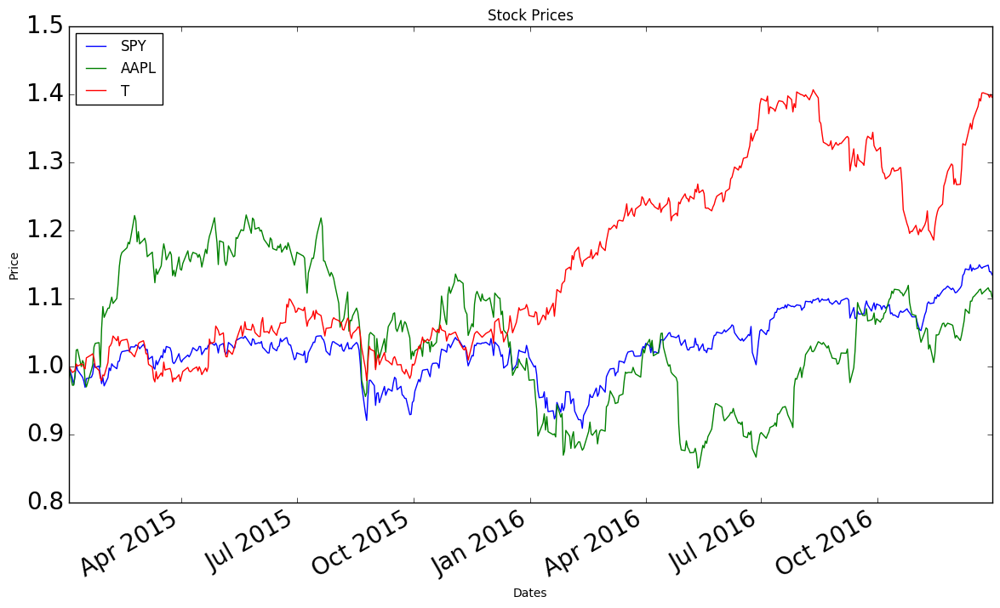

In [3]:
# read and prep the data
# a lot of this code taken from the Udacity course 'Machine Learning for Trading'
import data_utilities as du


start_date = '2015-01-01'
end_date = '2016-12-31'


symbols = ['AAPL','T']
df = du.get_data(symbols,start_date,end_date)

print df[0:20]


vs.plot_data(df,normalize=True)







### Deriving additional features
We will be using derived features including moving averages for different time windows and daily returns compare one day's price to the next. The following shows some examples.

             AAPL      MA(20)     STD(20)      UB(20)      LB(20)      MA(50)  \
count  304.000000  304.000000  304.000000  304.000000  304.000000  304.000000   
mean   104.658650  104.418598    2.830799  110.080197   98.757000  104.311123   
std      8.214663    7.420226    1.185938    7.721405    7.858181    6.319536   
min     89.008370   92.475216    1.061963   96.073404   83.857381   94.287517   
25%     96.471716   96.565596    1.988808  102.012389   91.116444   98.543413   
50%    105.864837  106.338475    2.632112  111.053310  100.624850  102.863265   
75%    111.689039  111.030437    3.446125  117.217869  106.006239  111.215040   
max    118.875815  115.192505    7.077040  121.734479  111.259817  112.760520   

          STD(50)      UB(50)      LB(50)     MA(100)    STD(100)     UB(100)  \
count  304.000000  304.000000  304.000000  304.000000  304.000000  304.000000   
mean     4.580739  113.472601   95.149645  104.538053    6.258811  117.055676   
std      1.518776    6.4126

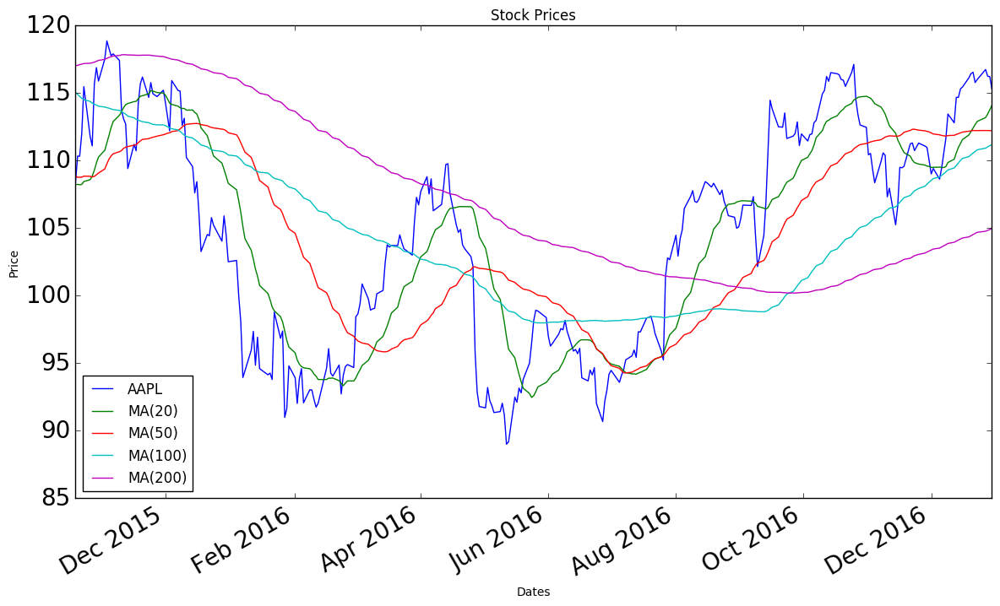

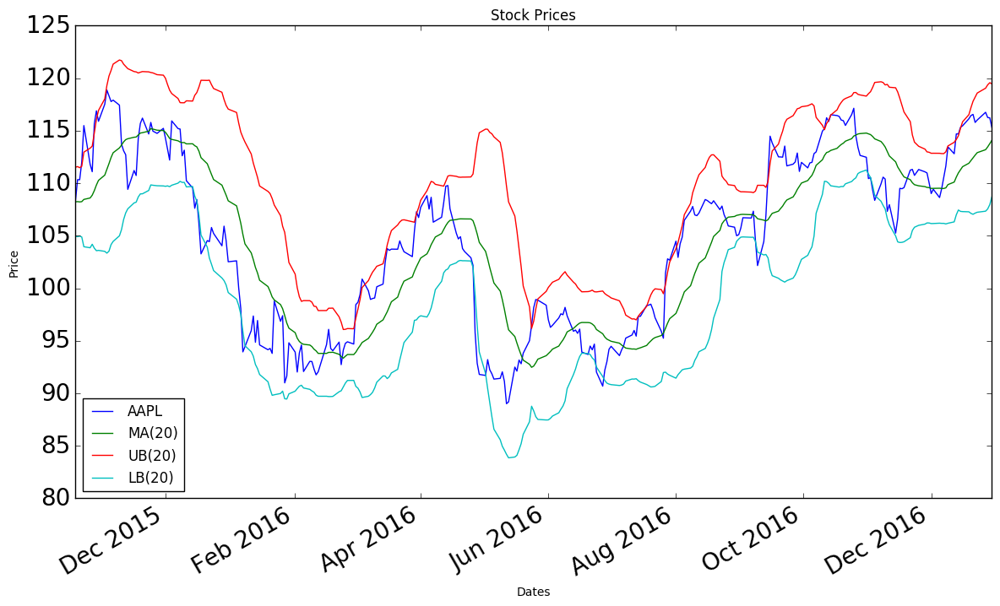

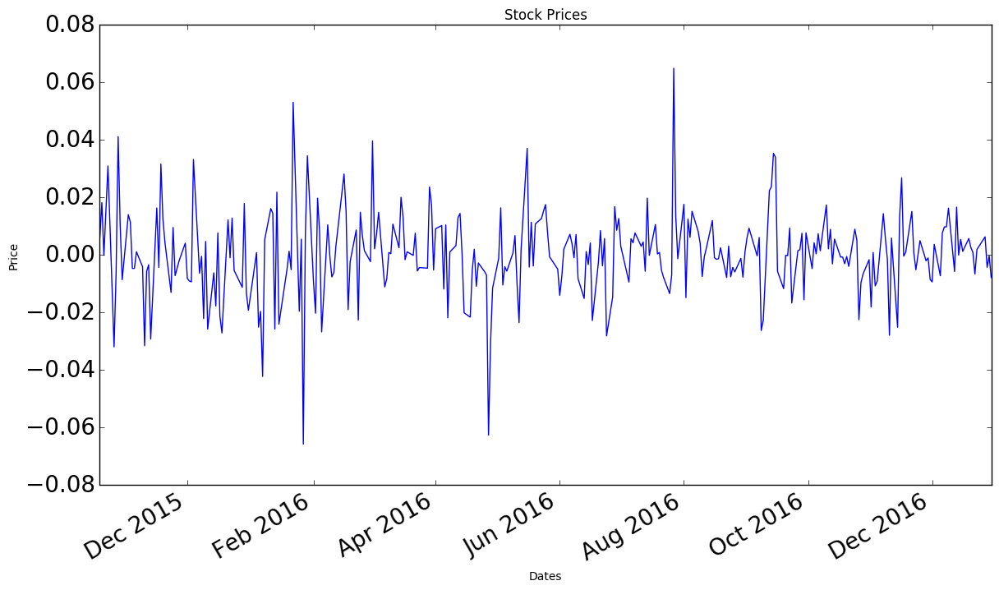

In [24]:

#dates = pd.date_range(start_date, end_date)
cdf = pd.DataFrame()
cdf['AAPL'] = df['AAPL']
for window in (20,50,100,200):
    ma = 'MA('+str(window)+")"
    cdf[ma] = du.get_rolling_mean(cdf['AAPL'],window=window)  # rolling average for specified window
    #du.fill_missing_values(cdf[ma])   
    std = 'STD('+str(window)+")"
    cdf[std] = du.get_rolling_std(cdf['AAPL'],window=window) # rolling stndard deviation for specified window
    ub = 'UB('+str(window)+")"
    lb = 'LB('+str(window)+")"
    cdf[ub], cdf[lb] = du.get_bollinger_bands(cdf[ma], cdf[std])# bollinger bands
cdf['Daily_Return'] = du.compute_daily_returns(cdf['AAPL'])

#cut off first 200 days
cdf = cdf[200:]
print cdf.describe()
print cdf[0:10]

vs.plot_data(cdf[['AAPL','MA(20)','MA(50)','MA(100)','MA(200)']])

vs.plot_data(cdf[['AAPL','MA(20)','UB(20)','LB(20)']])

vs.plot_data(cdf['Daily_Return'])



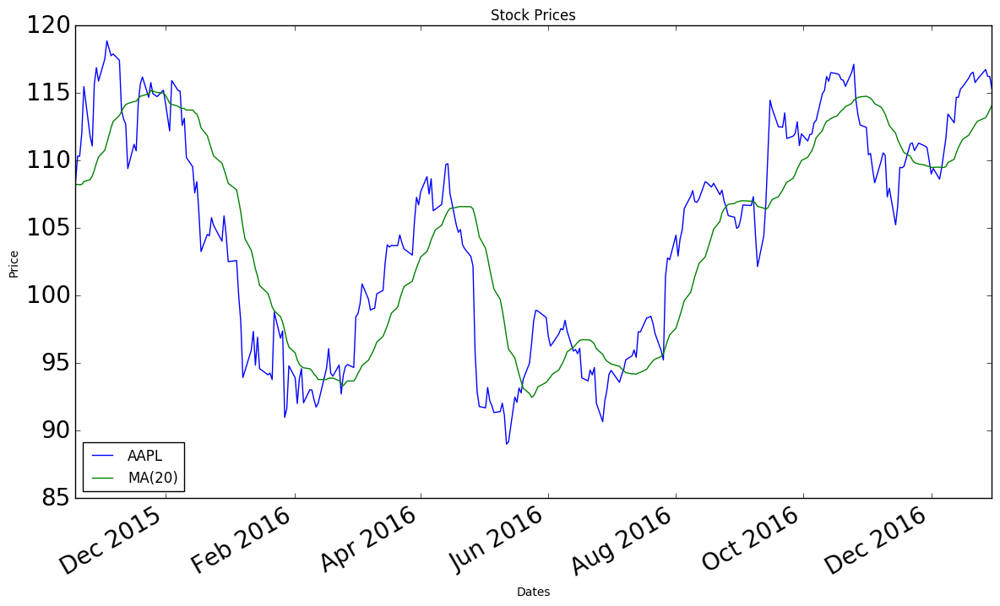

In [88]:
vs.plot_data(cdf[['AAPL','MA(20)']])

## Predicting Stock Prices
Although utimately the goal of this project is not stock price prediction I wanted to run some examples to see how well prediction might work.  These are not optimized in any way and in the case of the Hidden Markov Model I am not sure I got the prediction algorithm correct.  The project report references other works that focus on price prediction. What you will see here in general is that we can fit to the training data well but that once outside that range the predictor accuracy falls. It may be adequate for a few days after the training period but can be relied on much after that.  Nothing is really "learned" from the training data that will help predict the future. 

I also tried these on other features such as moving average to reduce noise in the data but the results were consistent - good fit on the training data but poor prediction.

### Subset data for regressors
The following creates training and test sets for the subsequent regression techniques.

In [5]:
def split_data(shares_days,shares_values):
    # 70/30 training test split
    start_test = 7*len(shares_days)/10
    X = shares_days[:start_test]
    X = X.reshape(-1,1)
    y = shares_values[:start_test]
    print len(X), "Samples"

    # Test set is entire data set
    X_test = shares_days
    X_test = X_test.reshape(-1,1)
    y_test = shares_values
    print len(X_test), "Total"

    X_pred = shares_days[-(len(shares_days)-start_test):]
    X_pred = X_pred.reshape(-1,1)
    y_pred = shares_values[-(len(shares_days)-start_test):]
    print len(X_pred),"Forecast"
    
    return X, y, X_test, y_test, X_pred, y_pred

# this is for the regressor models
shares_close = df['AAPL'][200:]
shares_days = np.arange(0,len(shares_close))
X, y, X_test, y_test, X_pred, y_pred = split_data(shares_days, shares_close)
start_test = len(X)



212 Samples
304 Total
92 Forecast


### Decision Tree Regressor
We can get a good fit for the training set but the prediction is flat.

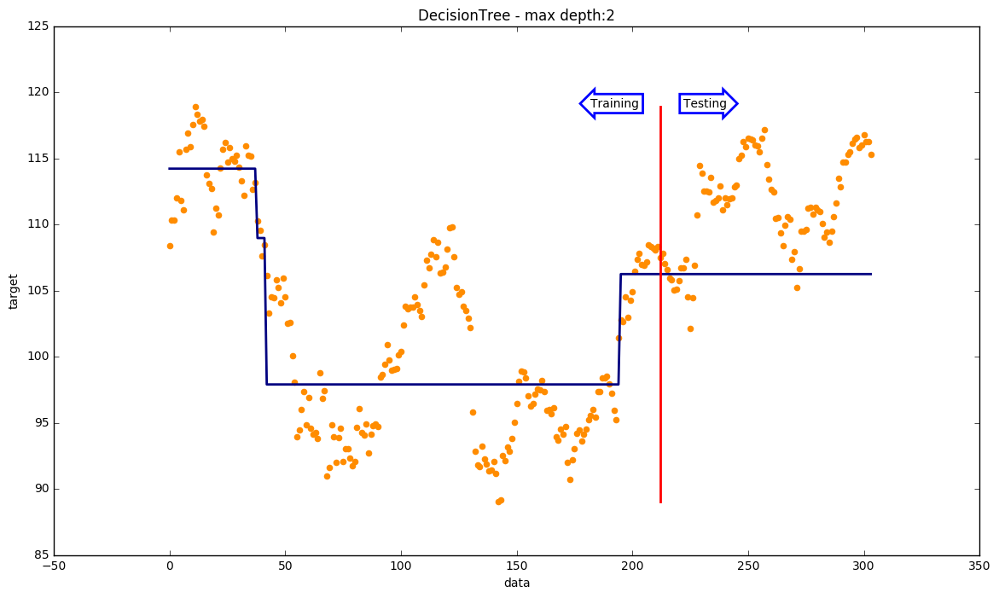

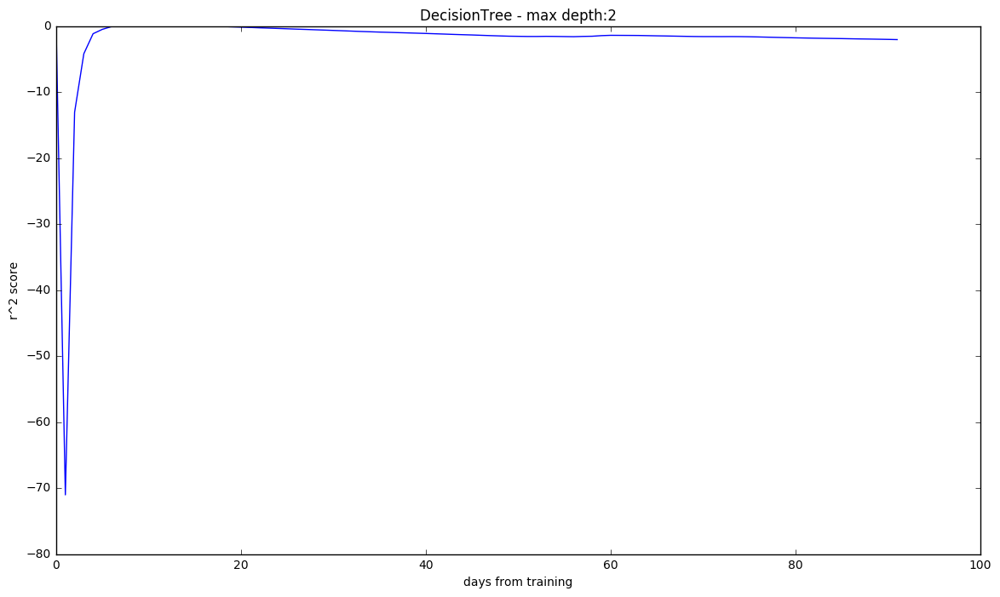

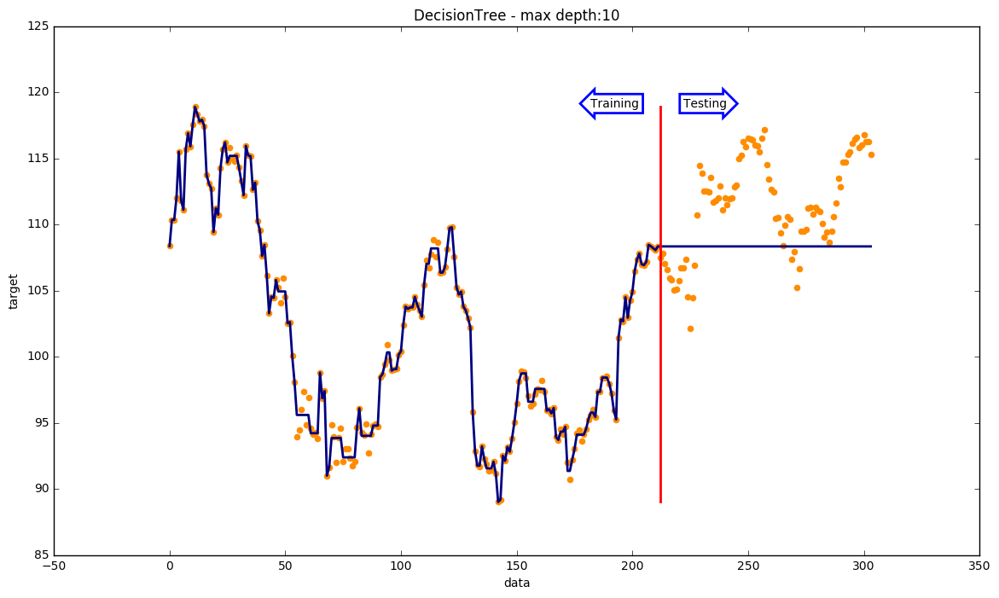

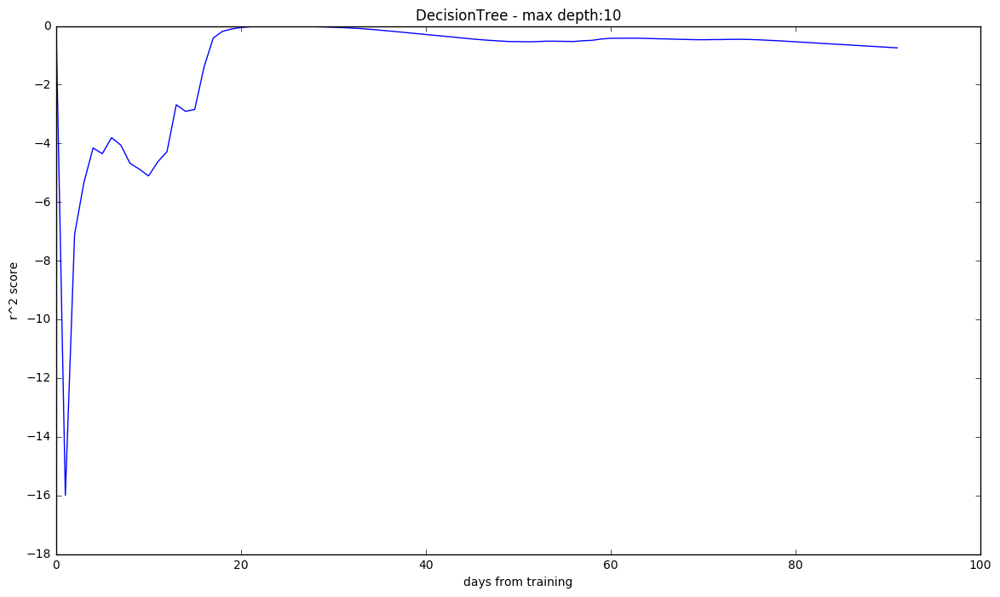

In [11]:
import visuals as vs
from sklearn.tree import DecisionTreeRegressor

# Fit and predict regression model
regr_1 = DecisionTreeRegressor(max_depth=2)
y_1 = regr_1.fit(X,y).predict(X_test)
vs.plot_results(X_test, start_test, y_test, y_1, "DecisionTree - max depth:2")
vs.score_predictions(regr_1,X_pred,y_pred,"DecisionTree - max depth:2")

regr_2 = DecisionTreeRegressor(max_depth=10)
y_2 = regr_2.fit(X,y).predict(X_test)
vs.plot_results(X_test, start_test, y_test, y_2, "DecisionTree - max depth:10")
vs.score_predictions(regr_2,X_pred,y_pred,"DecisionTree - max depth:10")

### KNN
Again, good fit to training.

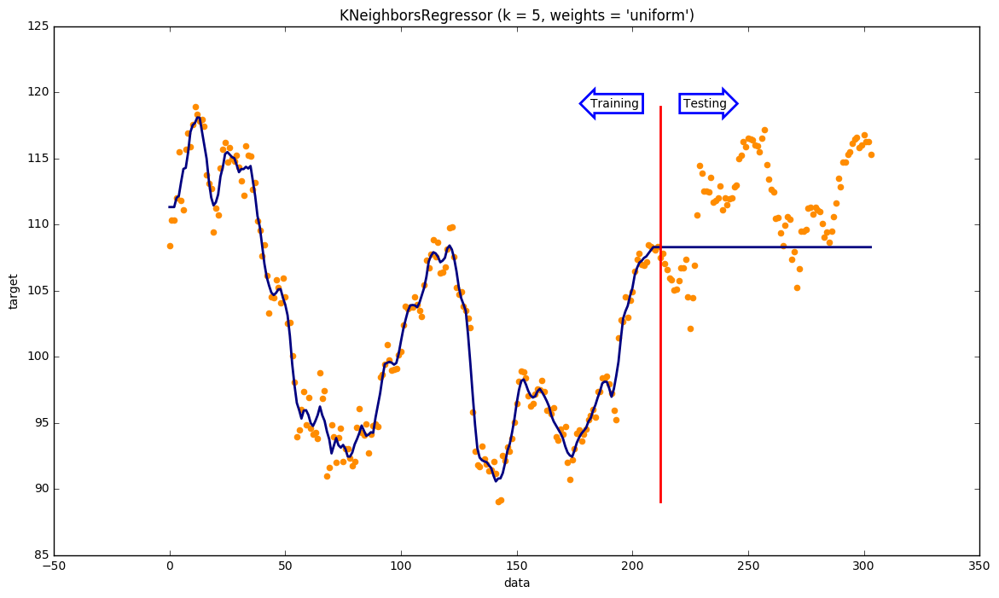

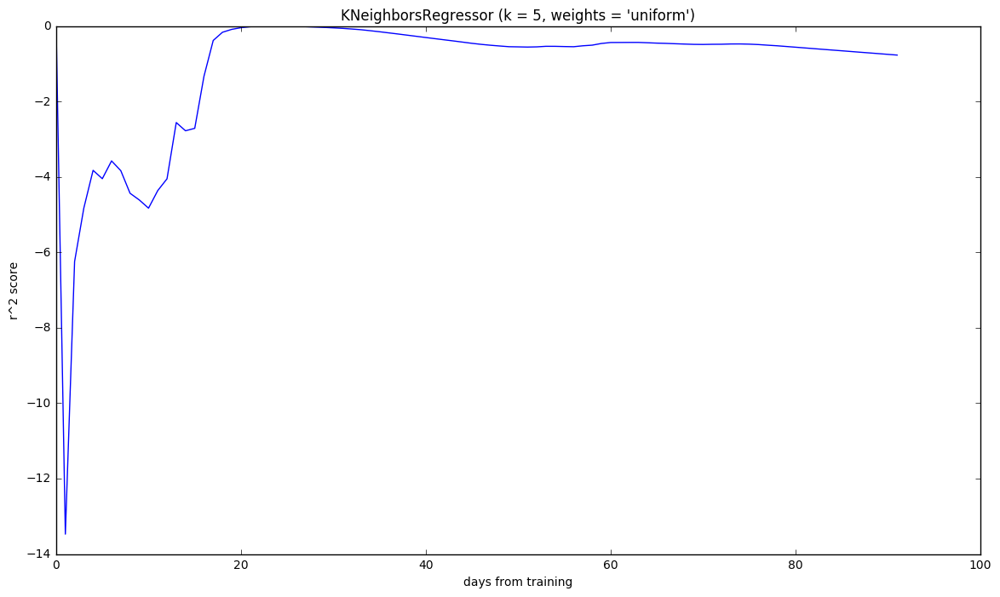

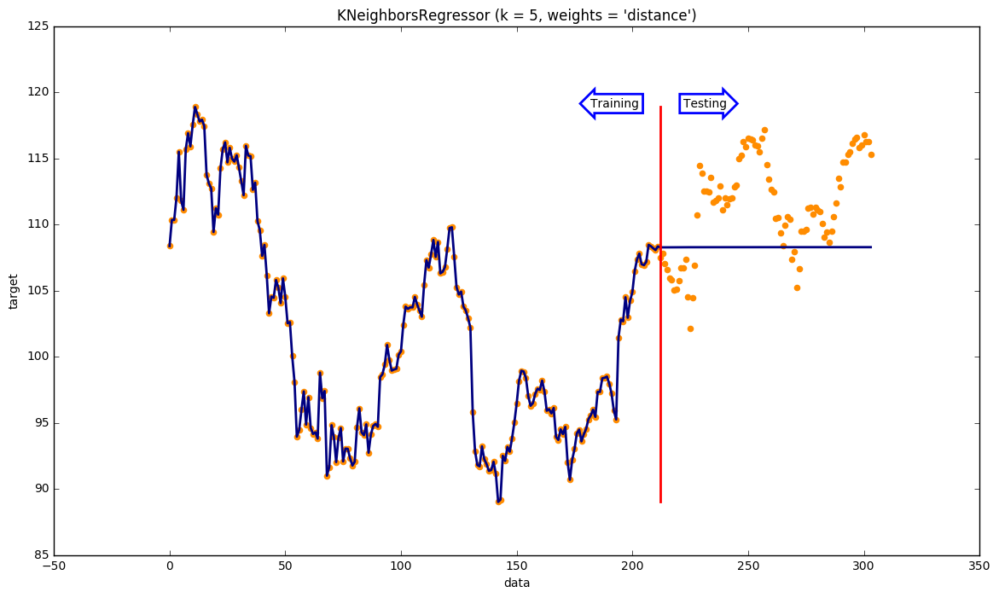

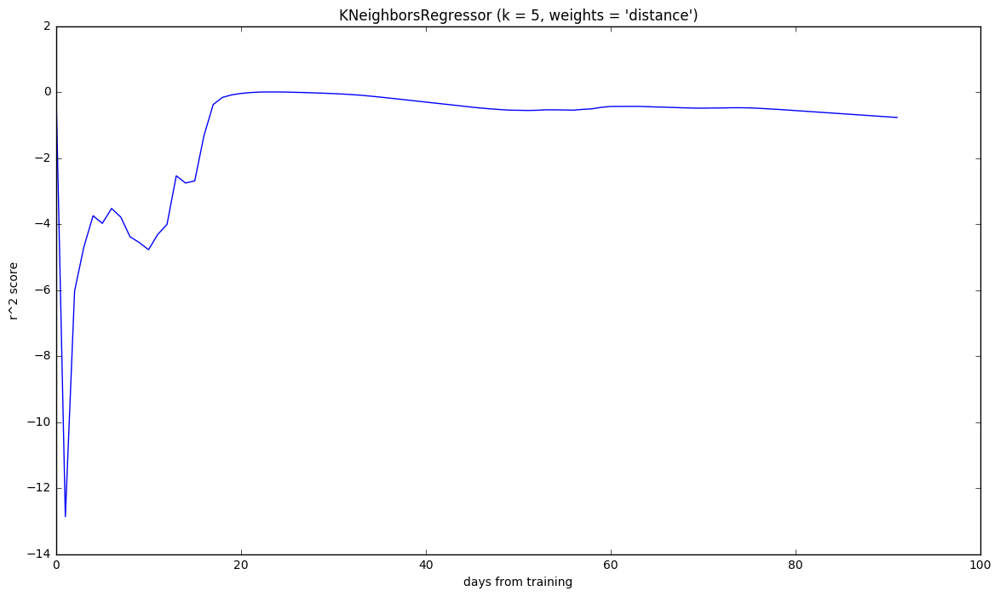

In [12]:
from sklearn import neighbors

n_neighbors = 5

for i, weights in enumerate(['uniform', 'distance']):
    knn = neighbors.KNeighborsRegressor(n_neighbors, weights=weights)
    y_ = knn.fit(X, y).predict(X_test)
    #score = knn.score(X_test,y_test)
   
    title = "KNeighborsRegressor (k = %i, weights = '%s')" % (n_neighbors, weights)
    vs.plot_results(X_test, start_test, y_test, y_, title)
    vs.score_predictions(knn,X_pred,y_pred,title)


### Support Vector Machines

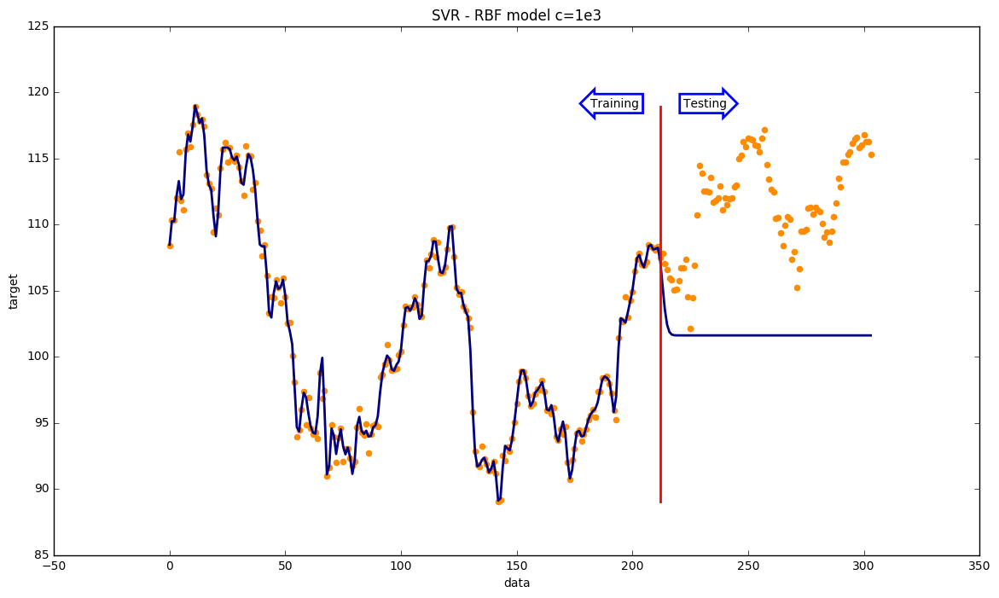

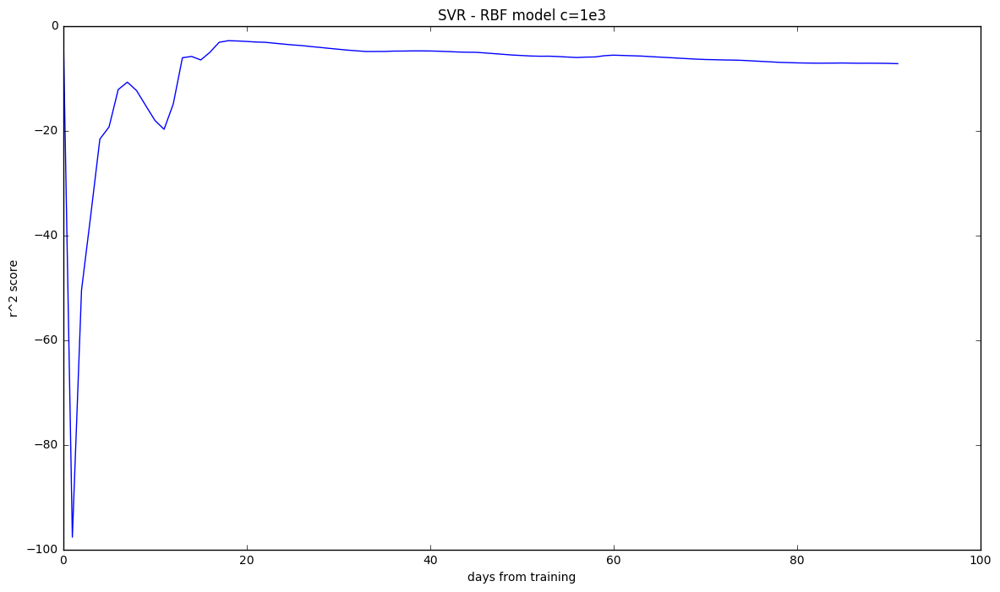

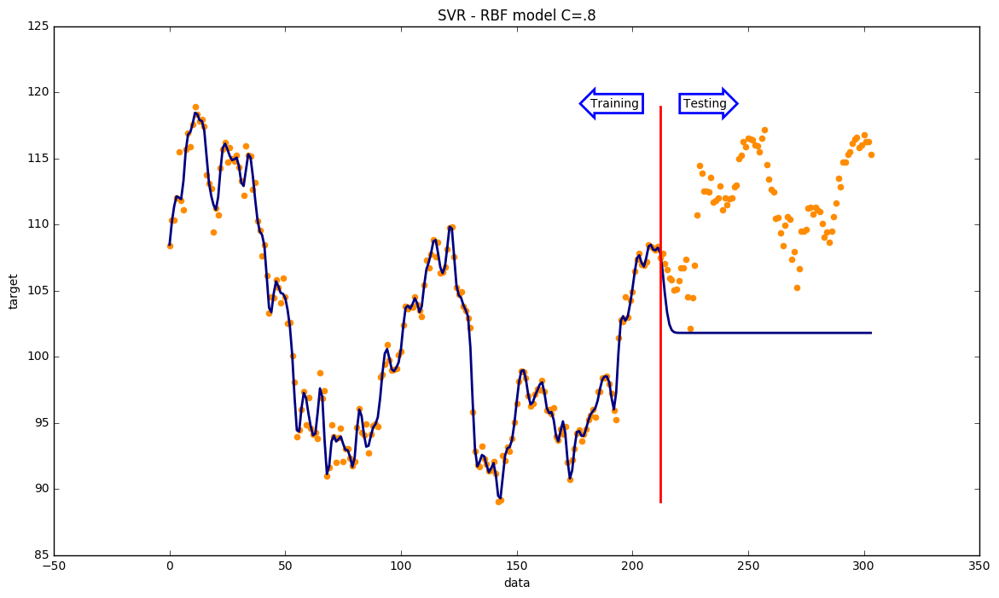

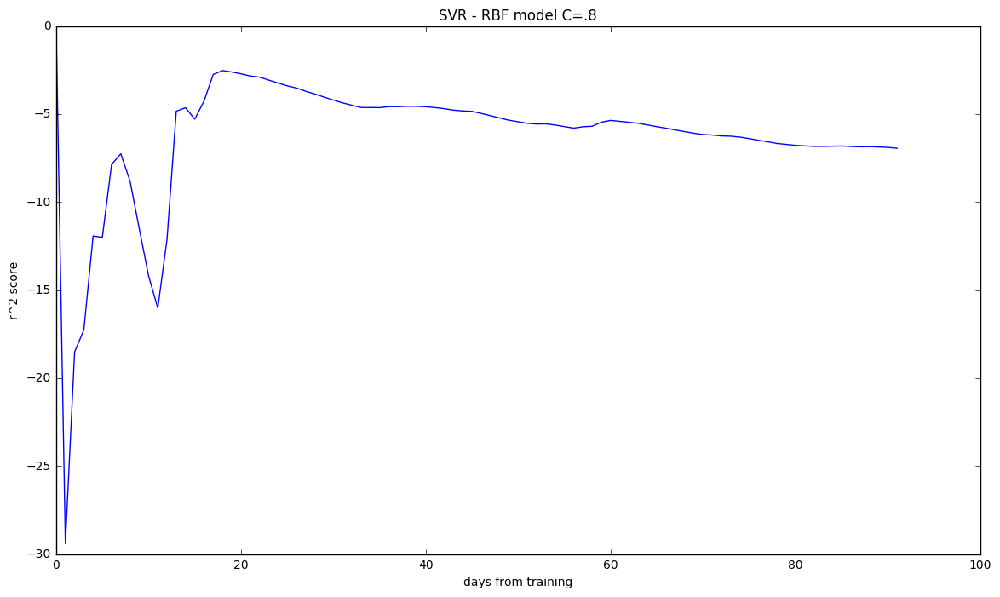

In [13]:
from sklearn.svm import SVR

svr_rbf = SVR(kernel='rbf', C=1e3, gamma=0.1)
y_rbf = svr_rbf.fit(X, y).predict(X_test)
vs.plot_results(X_test, start_test, y_test, y_rbf, "SVR - RBF model c=1e3")
vs.score_predictions(svr_rbf,X_pred,y_pred,"SVR - RBF model c=1e3")

svr_rbf = SVR(kernel='rbf',  C=100, gamma=0.1)
y_rbf = svr_rbf.fit(X, y).predict(X_test)
vs.plot_results(X_test, start_test, y_test, y_rbf, "SVR - RBF model C=.8")
vs.score_predictions(svr_rbf,X_pred,y_pred,"SVR - RBF model C=.8")


# never could get this to finish - ran too long
#svr_poly = SVR(kernel='poly', C=1e3, degree=5)
#y_poly = svr_poly.fit(X, y).predict(X_test)
#plot_results(X_test, start_test, y_test, y_poly, "SVR - Polynomial model")



### Random-Forest

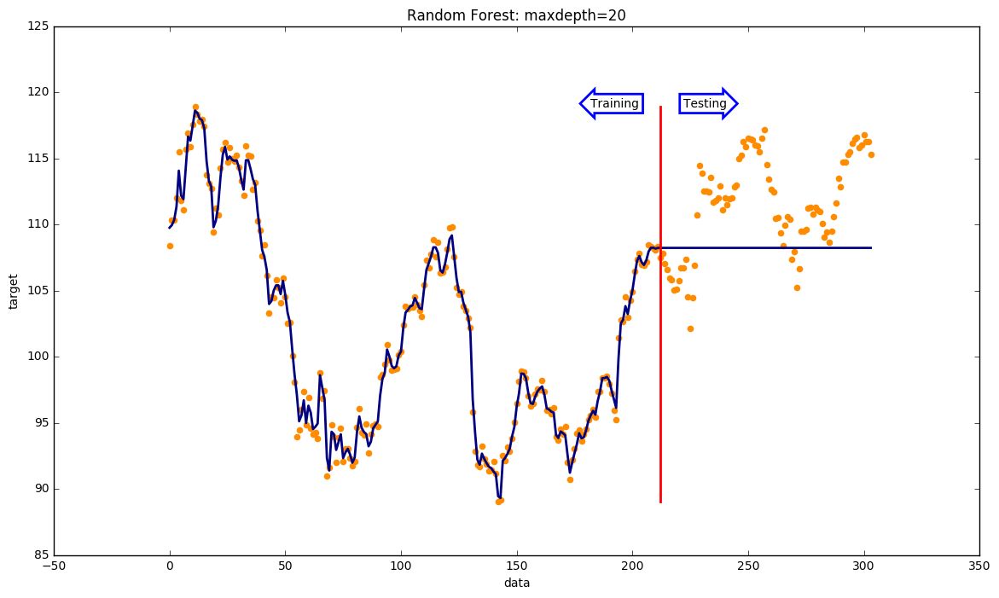

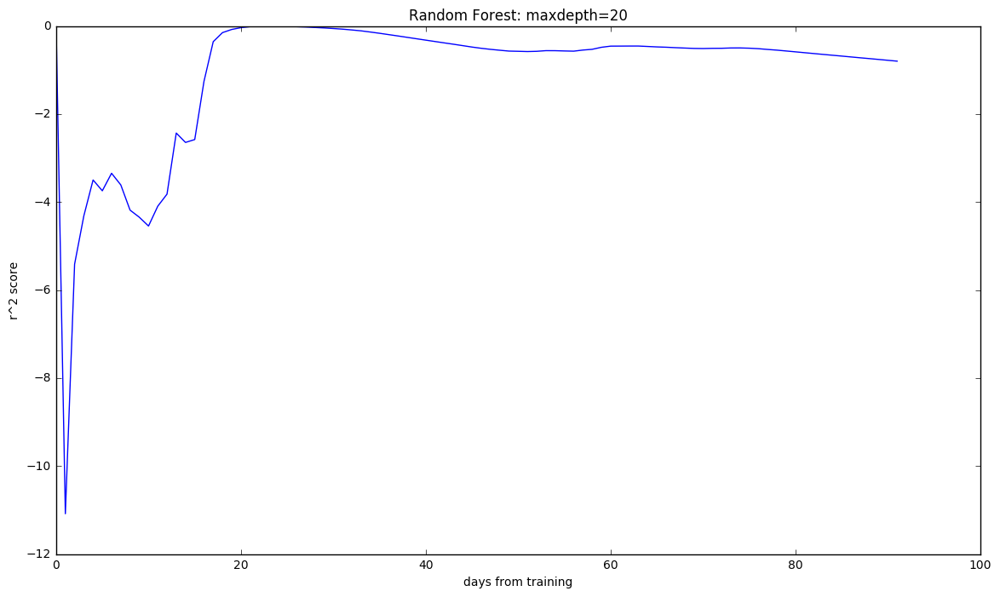

In [15]:
from sklearn.ensemble import RandomForestRegressor

rfreg = RandomForestRegressor(max_depth=20)
y_ = rfreg.fit(X, y).predict(X_test)
vs.plot_results(X_test, start_test, y_test, y_, "Random Forest: maxdepth=20")
vs.score_predictions(rfreg,X_pred,y_pred,"Random Forest: maxdepth=20")


### Hidden Markov Model
Modified sample code provided for the library. Don''t think the prediction algortithm is correct though.


212 Samples
304 Total
92 Forecast
('hidden states', 304)
(0, 3)
Transition matrix
[[  1.21645333e-28   2.40083075e-17   5.03499792e-01   4.96500208e-01]
 [  3.11137579e-01   3.73891580e-03   6.80943764e-01   4.17974074e-03]
 [  1.40583448e-23   9.98164713e-01   1.83511396e-03   1.73419620e-07]
 [  6.18791632e-12   6.23798398e-02   1.75236175e-04   9.37444924e-01]]
()
Means and vars of each hidden state
0th hidden state
('mean = ', array([ 2.95999237]))
('var = ', array([ 2.50866504]))
()
1th hidden state
('mean = ', array([-0.37084206]))
('var = ', array([ 1.35550174]))
()
2th hidden state
('mean = ', array([-1.22848067]))
('var = ', array([ 3.89348029]))
()
3th hidden state
('mean = ', array([ 0.21347434]))
('var = ', array([ 1.03241789]))
()


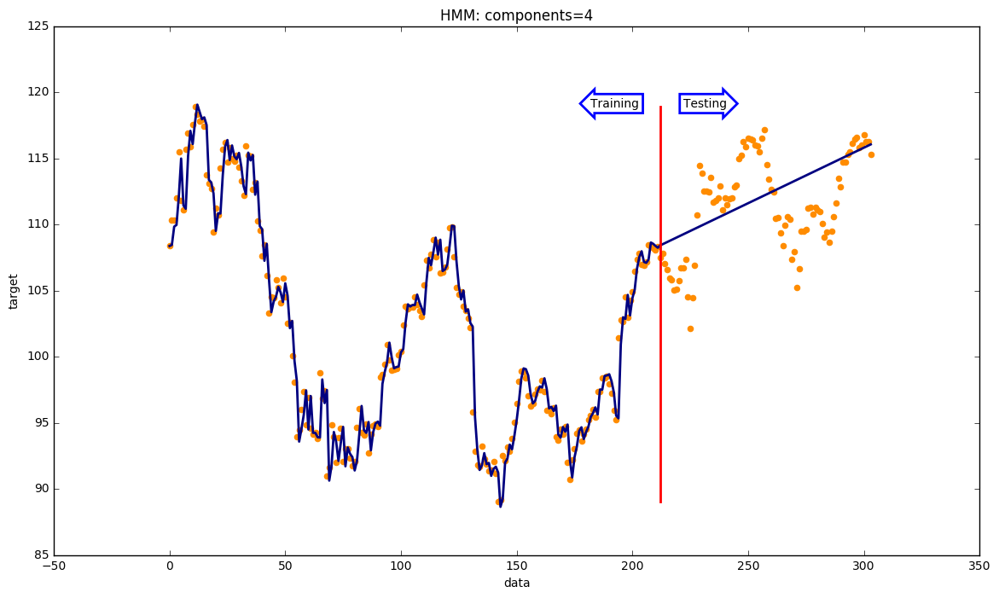

[1] 0


In [16]:
from hmmlearn.hmm import GaussianHMM

X, y, X_test, y_test, X_pred, y_pred = split_data(shares_days, shares_close)

# Pack diff for training - only takes the y value
diff_train = y - y.shift(1)
diff_train[0] = 0.0
Xtrain = np.column_stack([diff_train])
diff_test = y_test - y_test.shift(1)
diff_test[0] = 0.0
Xtest = np.column_stack([diff_test])

# Make an HMM instance and execute fit
hmmreg = GaussianHMM(n_components=4, covariance_type="diag", n_iter=1000,verbose=False)

# Predict the optimal sequence of internal hidden state
hidden_states = hmmreg.fit(Xtrain).predict(Xtest)
print ("hidden states",len(hidden_states))
#print(hidden_states[0:100])
#print(Xtrain[0:100])
print(min(hidden_states),max(hidden_states))
#print hmmreg.monitor_

expected_returns = np.dot(hmmreg.transmat_, hmmreg.means_)
returns_columnwise = zip(*expected_returns)
returns = returns_columnwise[0]

y_ = [y_test[0]]

#predcitions
for index in range(1,len(y_test)):
    if index < len(Xtrain): # use real data
        y_.append(y_test[index-1] + returns[hidden_states[index-1]])
    else: # use predicted data
        y_.append(y_[index-1] + returns[hidden_states[index-1]])
        pred_diff = [[y_[index]-y_[index-1]]]
        pred_state = hmmreg.predict(pred_diff)
        hidden_states[index] = pred_state[0]
    


    


vs.plot_results(X_test, start_test, y_test, y_, "HMM: components=4")
#score_predictions(rfreg,X_pred,y_pred,"Random Forest: maxdepth=20")

###############################################################################
from matplotlib import cm, pyplot as plt
from matplotlib.dates import YearLocator, MonthLocator
# Print trained parameters and plot
print("Transition matrix")
print(hmmreg.transmat_)
print()

print("Means and vars of each hidden state")
for i in range(hmmreg.n_components):
    print("{0}th hidden state".format(i))
    print("mean = ", hmmreg.means_[i])
    print("var = ", np.diag(hmmreg.covars_[i]))
    print()



plt.show()

last_pred = 0
for i in range(0,1000):
    pred =  hmmreg.predict(1.0)
    if pred != last_pred:
        print pred,last_pred
    last_pred = pred


## Simulated Stock Trader
Here is the code and results for simulating a stock trader''s actions.

### Crossover Trader
This is ''hardcoded'' trader that uses crossover of the adjusted close price with the 20 day moving average to make decisions.If the price dips below the average, indicating a downward trend, it sells. If it goes above the average, indicating an upward trend, it buys.

gain/loss using cross-over rules $2,639.47
ending price 115.32002
starting price 102.612183
gain/loss using buy-and-hold $1,238.43
         Date Action      Shares       Price    Gain/Loss
0  2016-02-16    buy  105.664349   94.639300     0.000000
1  2016-02-23   sell  105.664349   92.729673  -201.779493
2  2016-02-24    buy  104.114022   94.110479     0.000000
3  2016-04-18   sell  104.114022  105.254888  1160.289247
4  2016-05-20    buy  116.807987   93.816442     0.000000
5  2016-06-13   sell  116.807987   95.905188   243.982216
6  2016-07-07    buy  118.512494   94.525831     0.000000
7  2016-07-26   sell  118.512494   95.245066    85.238334
8  2016-07-27    buy  111.283175  101.432497     0.000000
9  2016-08-25   sell  111.283175  106.558539   570.442228
10 2016-09-07    buy  110.471862  107.341112     0.000000
11 2016-09-08   sell  110.471862  104.527812  -310.790490
12 2016-09-13    buy  107.985094  106.934963     0.000000
13 2016-10-26   sell  107.985094  114.503125   817.248686

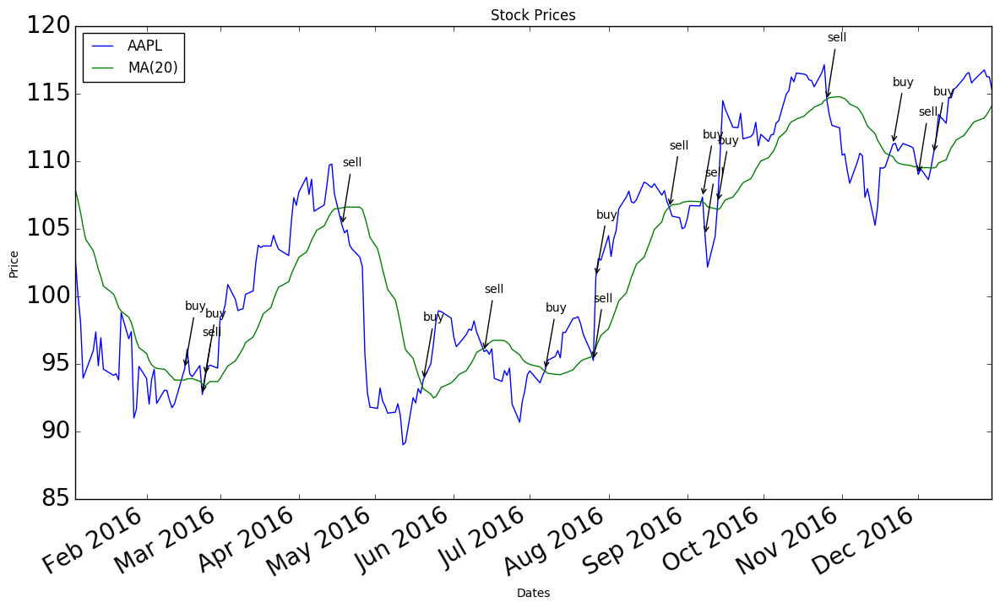

In [72]:
#simulate trading as a broker using cross-overs

def cross_over_trader(row,symbol):
    # compare price to moving average
    if row[symbol] < row['MA(20)']:
        action = 'sell'
    elif row[symbol] > row['MA(20)']:
        action  = 'buy'
    else: # just keep last state if price is unchanged
        action = 'hold' 
        
    return action


def simulate_trader(df,symbol,initial_investment,pred=cross_over_trader):
    
    
    transaction_history = pd.DataFrame(columns=['Date','Action','Shares','Price','Gain/Loss'])
    #transaction_history.set_index('Date')
    #buy_price = df[symbol][0]
    #shares = initial_investment / buy_price 
    shares = 0.0
    cash = initial_investment
    #prior_state = current_state = 'above'
    
    #transaction_history.loc[0] = [df.index[0],'buy',shares,buy_price, 0.0]
    #tindex = 1
    tindex=0
                                  
    for date, row in df.iterrows():
               
        action = pred(row,symbol)
        
        if action == 'buy' and cash > 0.0:
             buy_price = row[symbol]
             shares = cash/buy_price
             cash = 0.0
             transaction_history.loc[tindex] = [date, 'buy', shares, buy_price,0.0]
             tindex += 1
        if action == 'sell' and shares > 0.0:
            # sell stock
            cash = shares * row[symbol]
            transaction_history.loc[tindex] = [date,'sell',shares,row[symbol],cash-buy_price*shares]
            tindex += 1
            shares = 0.0
           
   
    if cash > 0.0:
        gain_loss = cash - initial_investment
    else:
        gain_loss = shares * df[symbol][-1] - initial_investment
        
    return gain_loss, transaction_history

# use later half for predictions so we can train elsewhere
#pdf = cdf[-len(cdf)/2:]
pdf = cdf['2016-01-01':'2016-12-31']
gl, trans_hist = simulate_trader(pdf,'AAPL',10000.00,cross_over_trader)
print ("gain/loss using cross-over rules ${:,.2f}".format(gl))
print 'ending price', pdf['AAPL'][-1]
print 'starting price', pdf['AAPL'][0]
print ("gain/loss using buy-and-hold ${:,.2f}".format( (10000.0 * pdf['AAPL'][-1]/pdf['AAPL'][0])-10000.00) )

print trans_hist
vs.plot_data(pdf[['AAPL','MA(20)']],normalize=False,actions=trans_hist) 






### Results
For these policies, using this stock and time period, the simulated trader outperforms a "buy and hold" approach.  The simulated trader made \$2700 on a \$10,000 investment where a buy-and-hold trader would have only made \$1240.  

### Q-learning trader
Leveraging work from the smartcab project a learning trader was implemented.  The program loads historical data, computes rolling averages and returns, trains for a period and then tests.  It displays the results of the investments made, the policies learned and plots the tranaction history.  

Retrieving stock data for stocks ['AAPL'] from 2014-06-15 to 2016-12-31
Computing averages and other data points
Starting training with portfolio value 10,000.00
Holdings before training------
         cash  shares  buy_price  price
AAPL  10000.0     0.0        0.0    0.0
training on stock AAPL for 443 days


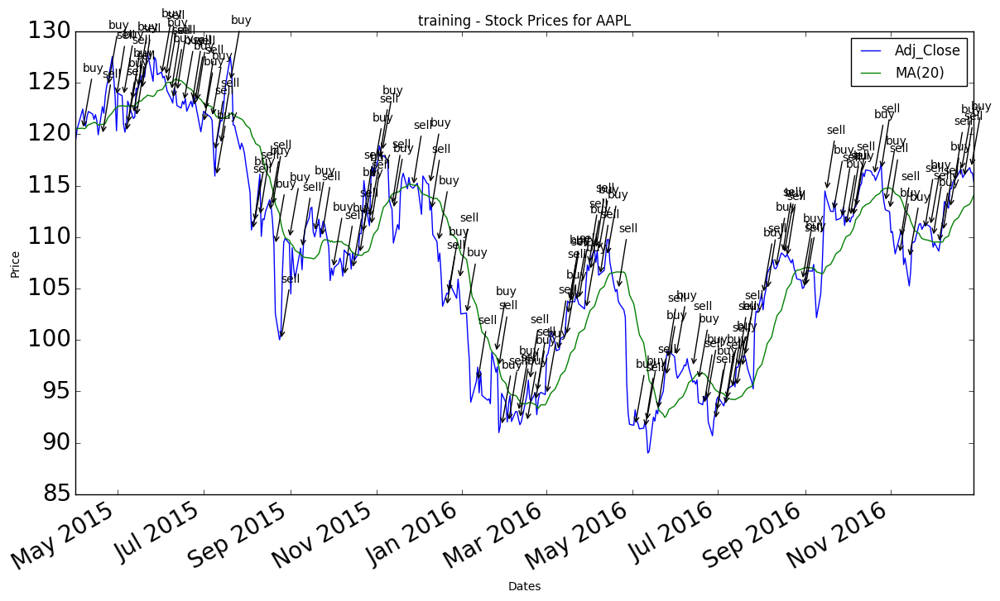

Ending training with portfolio value 9,214.76
Net return from training -785.24
Holdings after training------
      cash     shares   buy_price       price
AAPL   0.0  79.283055  116.753806  116.226096
Policies after training------
Policy ----
If has_stock is True and price is below moving average(20) then [None]
If has_stock is False and price is above moving average(20) then ['buy']
If has_stock is True and price is above moving average(20) then [None]
If has_stock is False and price is below moving average(20) then [None]
None
Starting testing with portfolio value 10,000.00
Holdings before testing------
         cash  shares   buy_price  price
AAPL  10000.0     0.0  116.753806    0.0
training on stock AAPL for 252 days


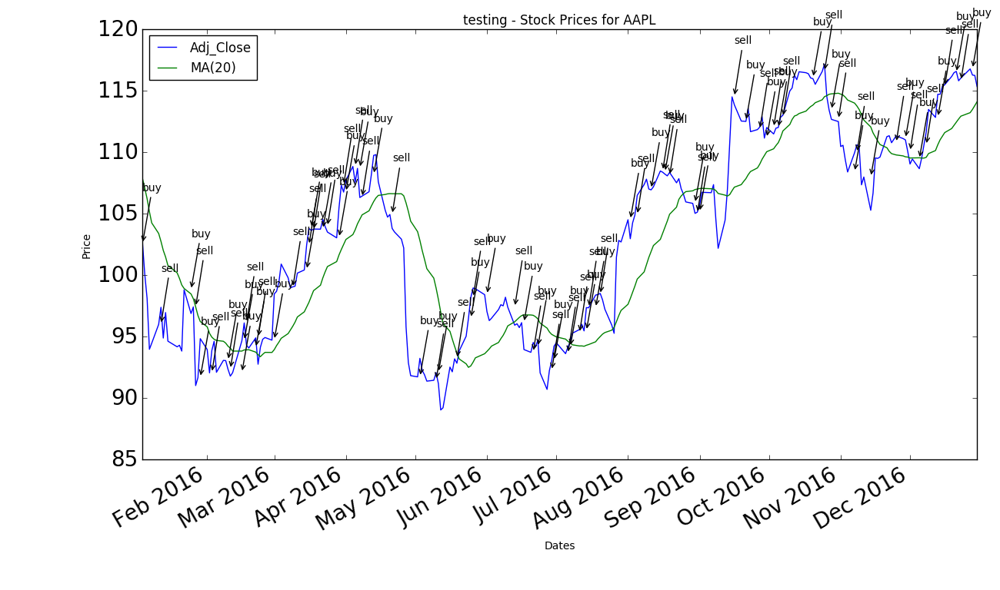

Ending testing with portfolio value 12,280.95
Net return from testing 2,280.95
Holdings after testing------
      cash      shares  buy_price       price
AAPL   0.0  105.664349    94.6393  116.226096
Policies after testing------
Policy ----
If has_stock is True and price is below moving average(20) then [None]
If has_stock is False and price is above moving average(20) then ['buy']
If has_stock is True and price is above moving average(20) then [None]
If has_stock is False and price is below moving average(20) then [None]
None


In [25]:
import trader as tr

tr.run(stocks=['AAPL'],initial_investment=10000.00, 
       start_train='2015-01-01',end_train='2105-12-31',
       start_test='2016-01-01',end_test='2016-12-31')


### Q-learner trader preliminary results
What is shown above is an early run of the learning trader using the same data as the crossover trader.  As you can see, the results don't look similar.  The policies aren't really what I'd expect and the trader makes many more buy/sell transactions than I anticpated.  Multiple iterations of the test with varying stocks, time periods, epislon decay all produced similar results. After looking into this more, I suspected that my reward calculation was off.  The initial reward was based on the returns from the next day.  If the trader bought stock and the returns went up, it was rewared and if it went down it was penalized.  If it sold stock and the returns went up it was penalized and if they went down it was rewarded.  I decided to investigate this further by analyzing the returns data.

Daily Returns where Price above Moving Average
count    171.000000
mean       0.003885
std        0.012361
min       -0.031911
25%       -0.003024
50%        0.002154
75%        0.009820
max        0.064963
Name: Daily_Return, dtype: float64
Daily Returns where Price below Moving Average
count    133.000000
mean      -0.004223
std        0.016849
min       -0.065707
25%       -0.011494
50%       -0.004154
75%        0.005685
max        0.053167
Name: Daily_Return, dtype: float64


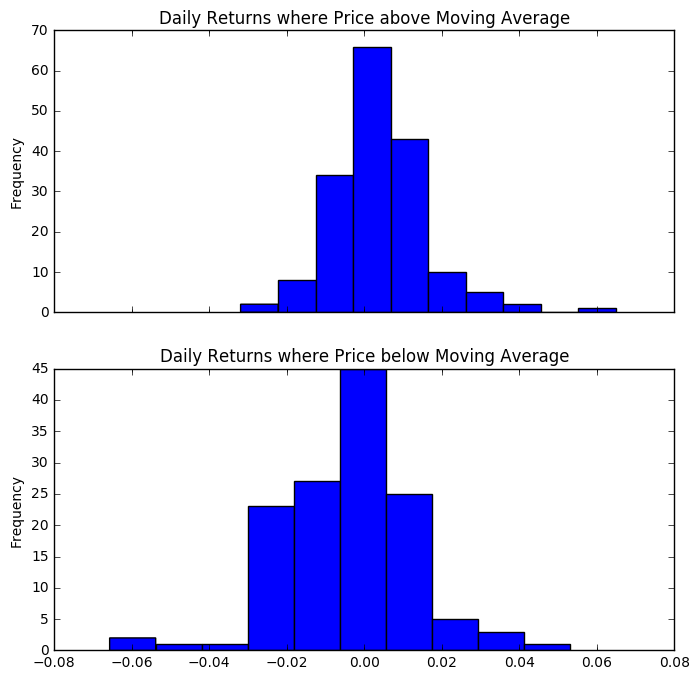

In [62]:
adf = cdf[cdf['AAPL']>cdf['MA(20)']]  # where price is trading above moving average
bdf = cdf[cdf['AAPL']<cdf['MA(20)']]# where price is trading below moving average
plt.subplots(figsize = (8,8))
ax1 = plt.subplot(2,1,1)
adf['Daily_Return'].plot.hist(title='Daily Returns where Price above Moving Average')
ax2 = plt.subplot(2,1,2,sharex=ax1)
bdf['Daily_Return'].plot.hist(title='Daily Returns where Price below Moving Average')
print 'Daily Returns where Price above Moving Average'
print adf['Daily_Return'].describe()
print 'Daily Returns where Price below Moving Average'
print bdf['Daily_Return'].describe()







You see from these graphs that the daily returns, although slightly skewed negative where the price is below the moving average and slightly skewed positive where the price is above, are close to being normally distributed.  This means that it is difficult to learn based on daily price returns as each action is almost equally likely to be rewarded negatively or positively. 

Based on this information I decided to look at returns based on the moving average not the daily price.

(another thought is add future rewards to the learning algortihm to see if that helps)

MA(20) Returns where Price above Moving Average
count    170.000000
mean       0.002481
std        0.002163
min       -0.005166
25%             NaN
50%             NaN
75%             NaN
max        0.005962
Name: MA(20)_Return, dtype: float64
MA(20) Returns where Price below Moving Average
count    133.000000
mean      -0.002760
std        0.003188
min       -0.010597
25%       -0.005027
50%       -0.002200
75%       -0.000061
max        0.003505
Name: MA(20)_Return, dtype: float64


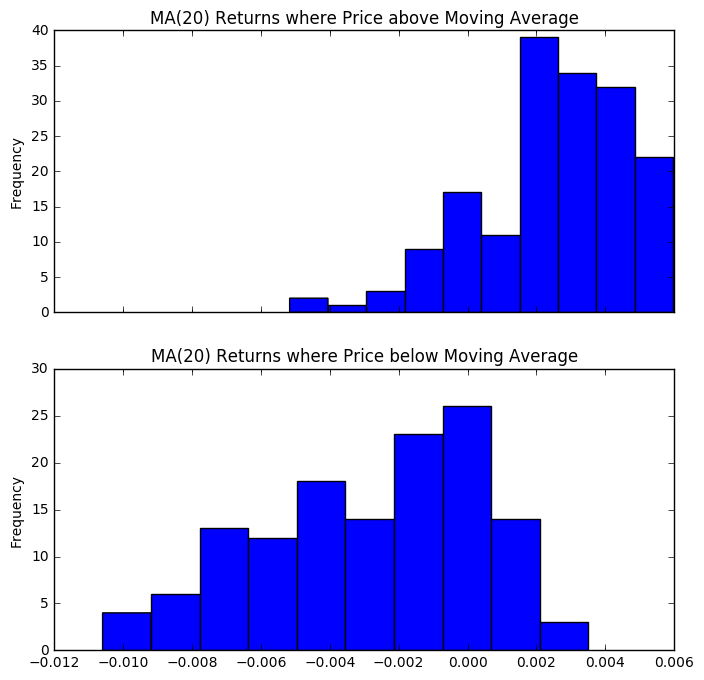

In [64]:
cdf['MA(20)_Return'] = du.compute_daily_returns(cdf['MA(20)'])
adf = cdf[cdf['AAPL']>cdf['MA(20)']]  # where price is trading above moving average
bdf = cdf[cdf['AAPL']<cdf['MA(20)']]# where price is trading below moving average

plt.subplots(figsize = (8,8))
ax1 = plt.subplot(2,1,1)
adf['MA(20)_Return'].plot.hist(title='MA(20) Returns where Price above Moving Average')
ax2 = plt.subplot(2,1,2,sharex=ax1)
bdf['MA(20)_Return'].plot.hist(title='MA(20) Returns where Price below Moving Average')
print 'MA(20) Returns where Price above Moving Average'
print adf['MA(20)_Return'].describe()
print 'MA(20) Returns where Price below Moving Average'
print bdf['MA(20)_Return'].describe()



Here we can see the data is much more skewed in each case providing a better discrimator for the rewards.  Based on this result I updated the reqard to use the return from the moving average.


### Q-learner with updated rewards calculation

Here are the preliminary results after updating the rewards to use MA(20)_Return.                                                                     

Retrieving stock data for stocks ['AAPL'] from 2014-03-07 to 2016-12-31
Computing averages and other data points
Starting training with portfolio value 10,000.00
Holdings before training------
         cash  shares  buy_price  price
AAPL  10000.0     0.0        0.0    0.0
training on stock AAPL for 252 days from 2015-01-01 to 2015-12-31


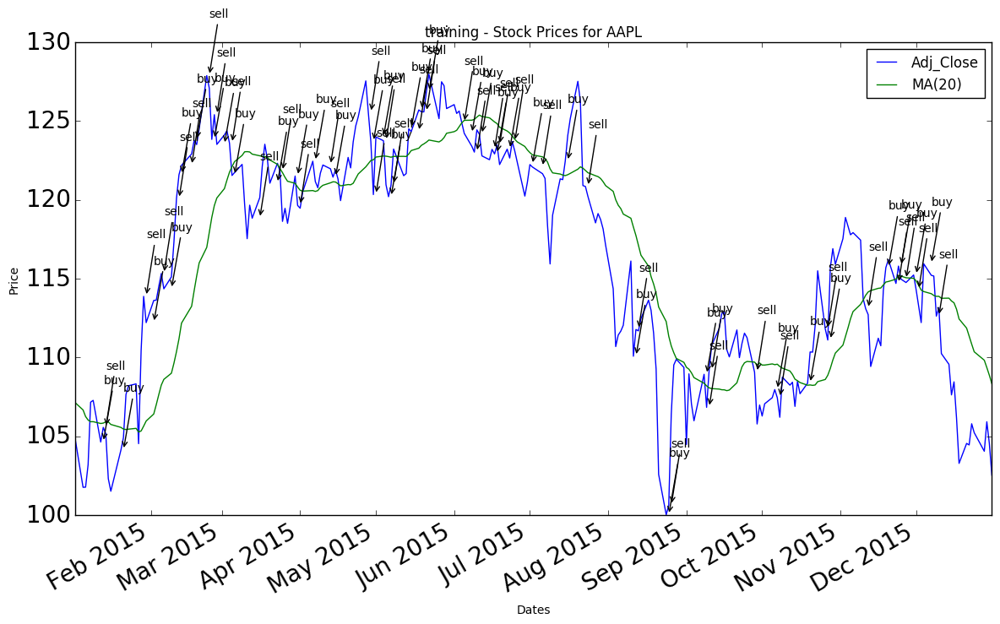

Ending training with portfolio value 11,643.30
Net return from training 1,643.30
Holdings after training------
              cash  shares   buy_price       price
AAPL  11643.297613     0.0  115.936671  104.530989
Policies after training------
Policy ----
If has_stock is True and price is below moving average(20) then ['sell']
If has_stock is False and price is above moving average(20) then ['buy']
If has_stock is True and price is above moving average(20) then [None]
If has_stock is False and price is below moving average(20) then [None]
None
Starting testing with portfolio value 10,000.00
Holdings before testing------
         cash  shares   buy_price  price
AAPL  10000.0     0.0  115.936671    0.0
testing on stock AAPL for 252 days from 2016-01-01 to 2016-12-31


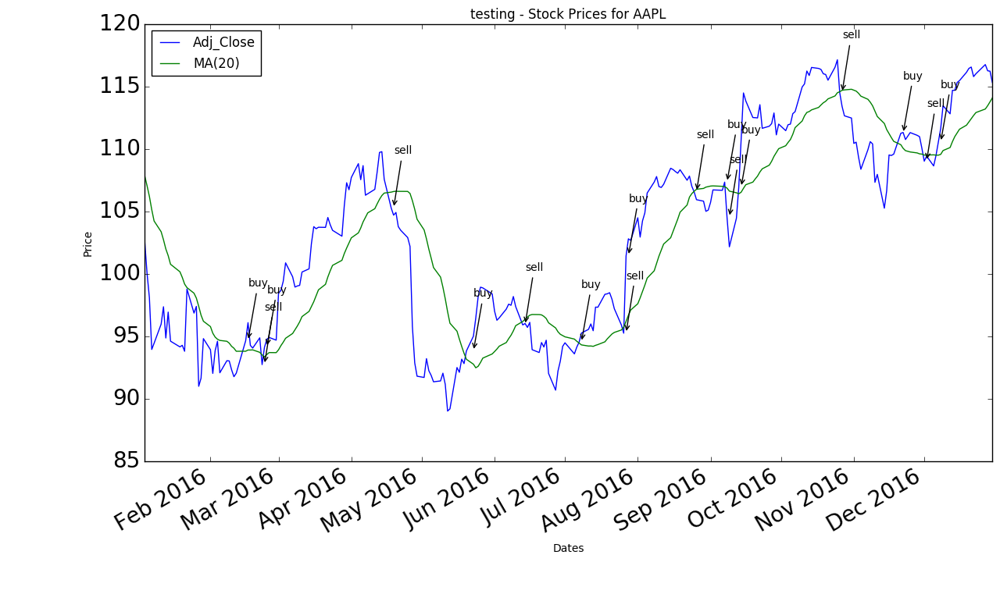

Ending testing with portfolio value 12,738.78
Net return from testing 2,738.78
Holdings after testing------
      cash      shares   buy_price       price
AAPL   0.0  109.603469  110.550697  116.226096
Policies after testing------
Policy ----
If has_stock is True and price is below moving average(20) then ['sell']
If has_stock is False and price is above moving average(20) then ['buy']
If has_stock is True and price is above moving average(20) then [None]
If has_stock is False and price is below moving average(20) then [None]
None


In [73]:
tr.run(stocks=['AAPL'],initial_investment=10000.00, 
       start_train='2015-01-01',end_train='2015-12-31',
       start_test='2016-01-01',end_test='2016-12-31')


### Adding features
Now that the learning trader has the basics down, I'll add some features. I already knew what to expect with the initial run but not so sure what the policies will be with the other data. I added in the 20 day Bollinger bands.  Perfrmance wasn't as good and itlooks like there wasn't enaouh training data toget all of the situations.

Retrieving stock data for stocks ['AAPL'] from 2014-03-07 to 2016-12-31
Computing averages and other data points
Starting training with portfolio value 10,000.00
Holdings before training------
         cash  shares  buy_price  price
AAPL  10000.0     0.0        0.0    0.0
training on stock AAPL for 252 days from 2015-01-01 to 2015-12-31


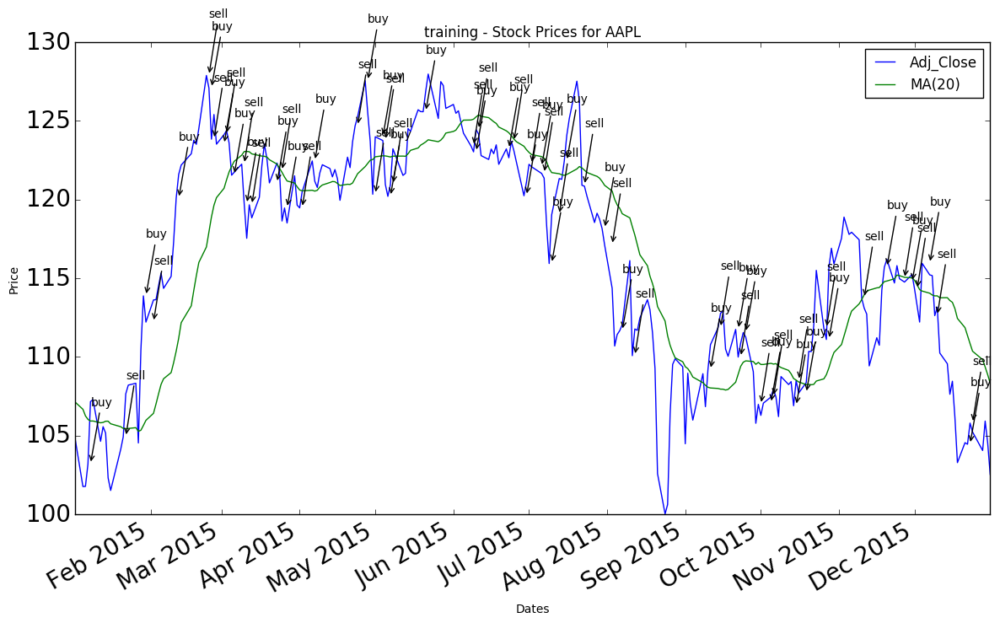

Ending training with portfolio value 10,409.37
Net return from training 409.37
Holdings after training------
              cash  shares   buy_price       price
AAPL  10409.365008     0.0  104.443331  104.530989
Policies after training------
Policy ----
If has_stock is True  and price is above MA(20) and price is above UB(20) and price is above LB(20) and price is above MA(50) and price is below UB(50) and price is above LB(50) then [None]. reward(0.000722508616028)
If has_stock is False  and price is below MA(20) and price is below UB(20) and price is below LB(20) and price is below MA(50) and price is below UB(50) and price is below LB(50) then [None]. reward(0.0045872184991)
If has_stock is False  and price is below MA(20) and price is below UB(20) and price is above LB(20) and price is below MA(50) and price is below UB(50) and price is above LB(50) then [None]. reward(0.00358277718172)
If has_stock is True  and price is above MA(20) and price is below UB(20) and price is above LB(2

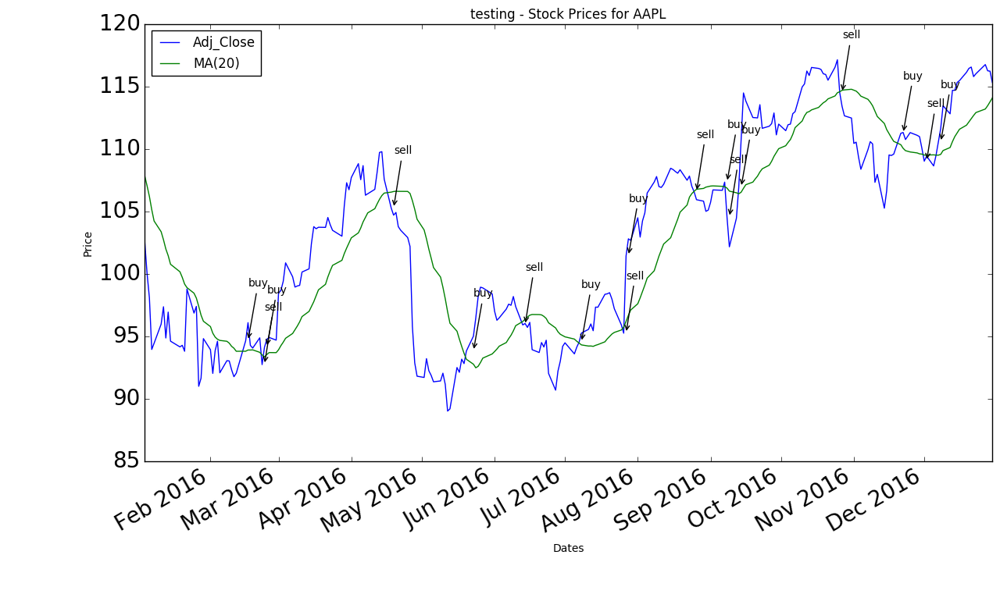

Ending testing with portfolio value 12,738.78
Net return from testing 2,738.78
Holdings after testing------
      cash      shares   buy_price       price
AAPL   0.0  109.603469  110.550697  116.226096
Policies after testing------
Policy ----
If has_stock is True  and price is above MA(20) and price is above UB(20) and price is above LB(20) and price is above MA(50) and price is below UB(50) and price is above LB(50) then [None]. reward(0.000722508616028)
If has_stock is False  and price is below MA(20) and price is below UB(20) and price is below LB(20) and price is below MA(50) and price is below UB(50) and price is below LB(50) then [None]. reward(0.0045872184991)
If has_stock is False  and price is below MA(20) and price is below UB(20) and price is above LB(20) and price is below MA(50) and price is below UB(50) and price is above LB(50) then [None]. reward(0.00358277718172)
If has_stock is True  and price is above MA(20) and price is below UB(20) and price is above LB(20) and pri

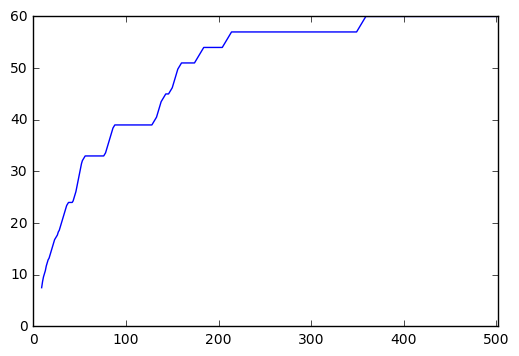

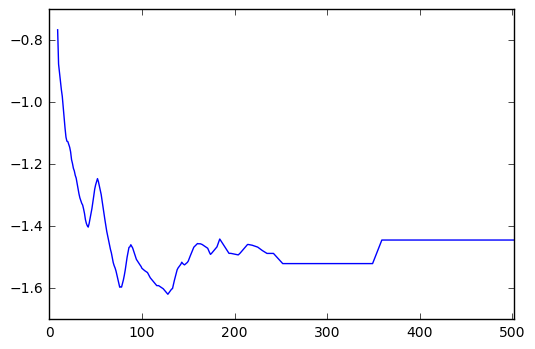

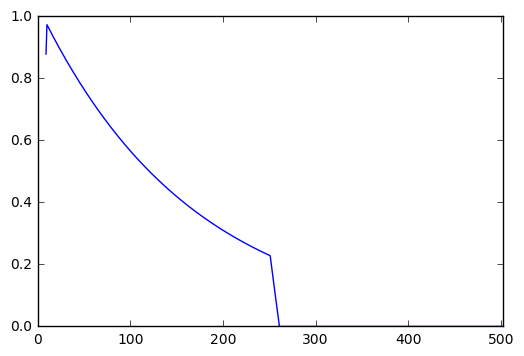

In [79]:
tr.run(stocks=['AAPL'],initial_investment=10000.00, 
       start_train='2015-01-01',end_train='2015-12-31',
       start_test='2016-01-01',end_test='2016-12-31')

## Add More Stocks
So far we only have been using Apple stock.Lets expand to use stocks in other industries as well.

Retrieving stock data for stocks ['AAPL', 'GE', 'XOM', 'DD', 'GS'] from 2014-03-07 to 2016-12-31
Computing averages and other data points
Starting training with portfolio value 50,000.00
Holdings before training------
         cash  shares  initial_price  buy_price  price
AAPL  10000.0     0.0            0.0        0.0    0.0
GE    10000.0     0.0            0.0        0.0    0.0
XOM   10000.0     0.0            0.0        0.0    0.0
DD    10000.0     0.0            0.0        0.0    0.0
GS    10000.0     0.0            0.0        0.0    0.0
training on stock AAPL for 252 days from 2015-01-01 to 2015-12-31


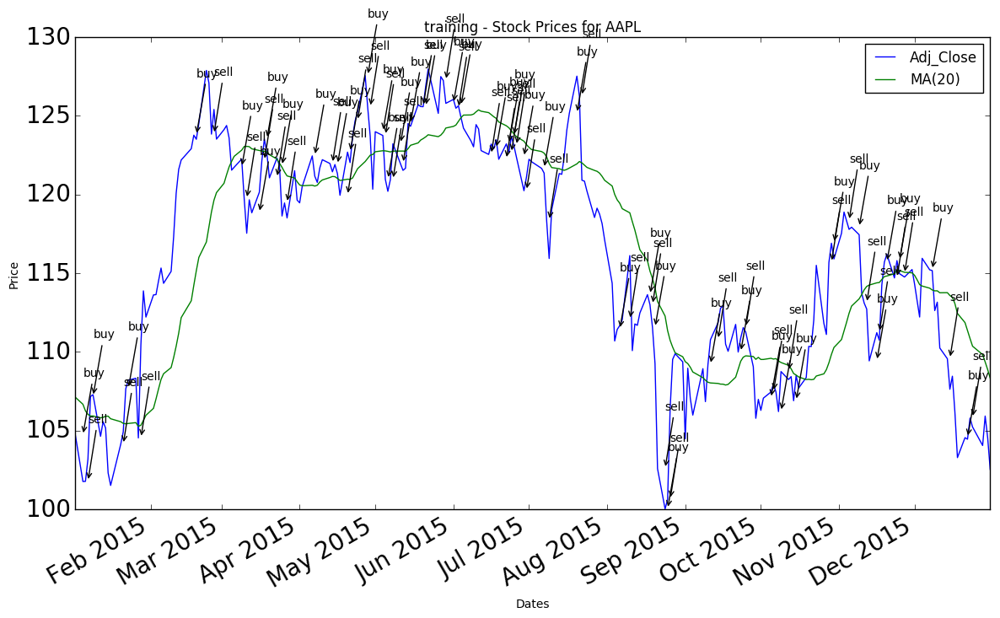

training on stock XOM for 252 days from 2015-01-01 to 2015-12-31


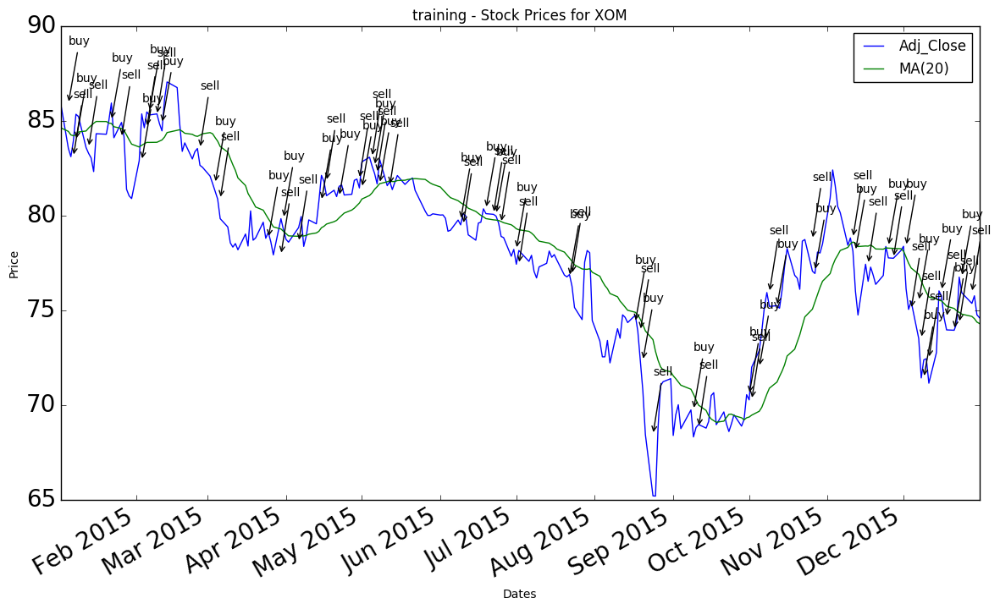

training on stock GS for 252 days from 2015-01-01 to 2015-12-31


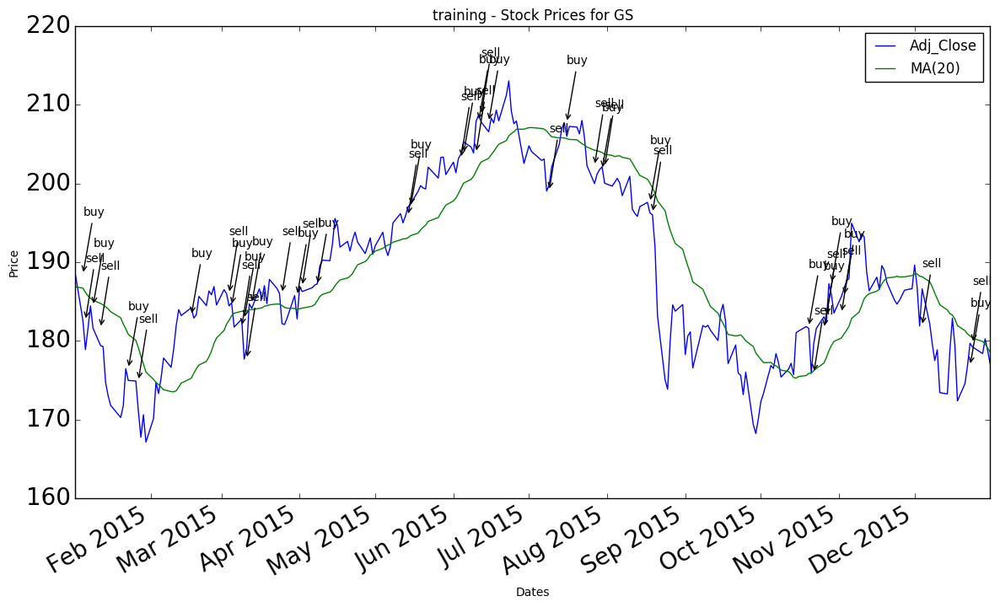

training on stock GE for 252 days from 2015-01-01 to 2015-12-31


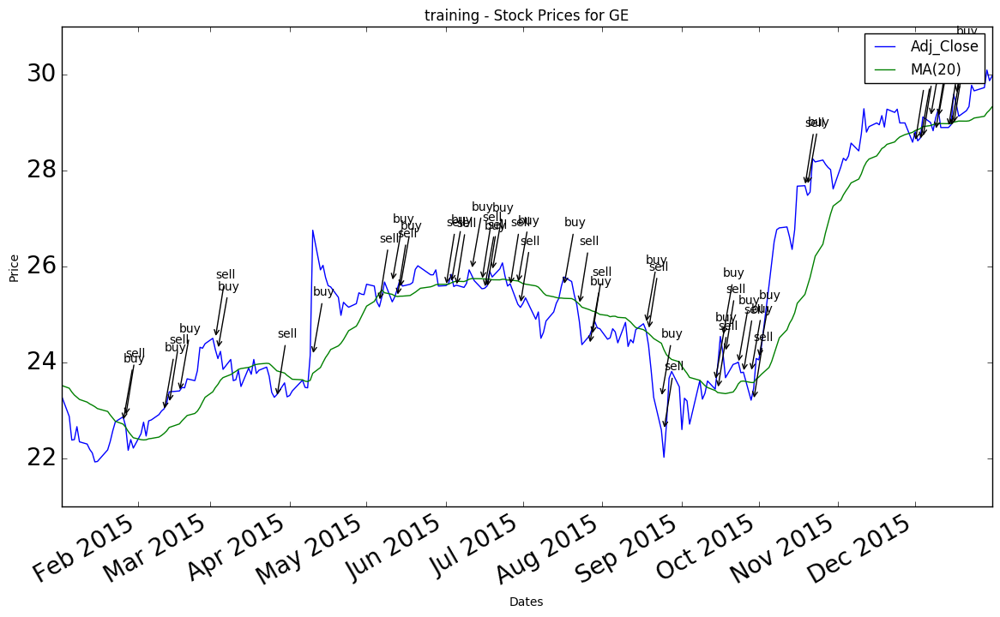

training on stock DD for 252 days from 2015-01-01 to 2015-12-31


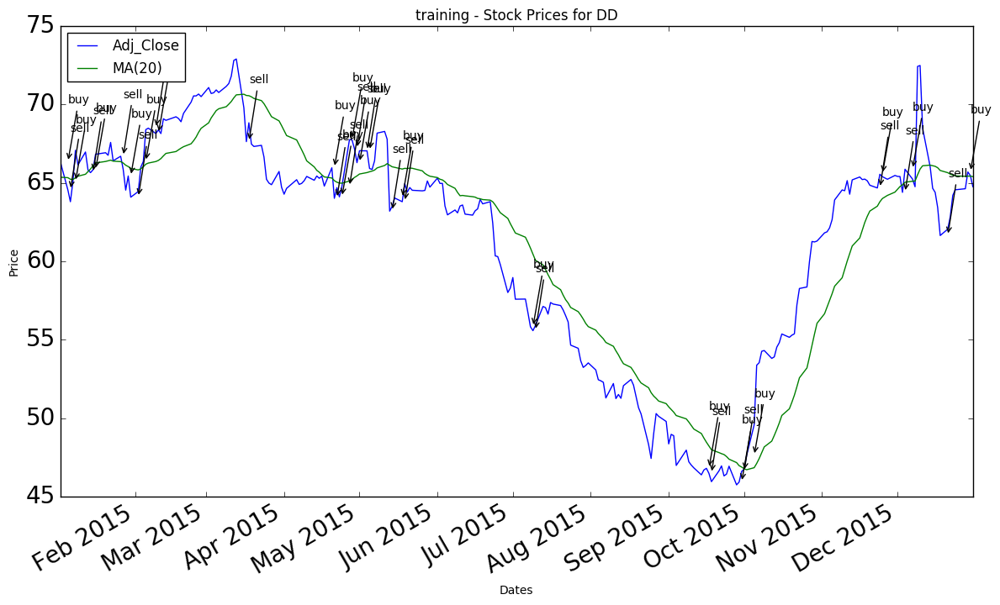

Ending training with portfolio value 48,237.89
Net return from training -1,762.11
Compared to buy/hold return of 858.814955085.
Holdings after training------
             cash      shares  initial_price   buy_price       price
AAPL  8065.101704    0.000000     104.704758  104.540731  104.530989
GE       0.000000  363.871836      23.302336   29.581604   29.870205
XOM   8882.513029    0.000000      85.903712   76.752397   74.761561
DD       0.000000  175.674886      66.332733   65.691903   65.458575
GS    8921.916559    0.000000     188.448888  176.832014  178.756975
Policies after training------
Policy ----
If has_stock is True  and price is above MA(20) and price is below UB(20) and price is above LB(20) and price is below MA(50) and price is below UB(50) and price is above LB(50) then [None]. reward(0.000731891942793)
If has_stock is False  and price is above MA(20) and price is above UB(20) and price is above LB(20) and price is below MA(50) and price is below UB(50) and price is abo

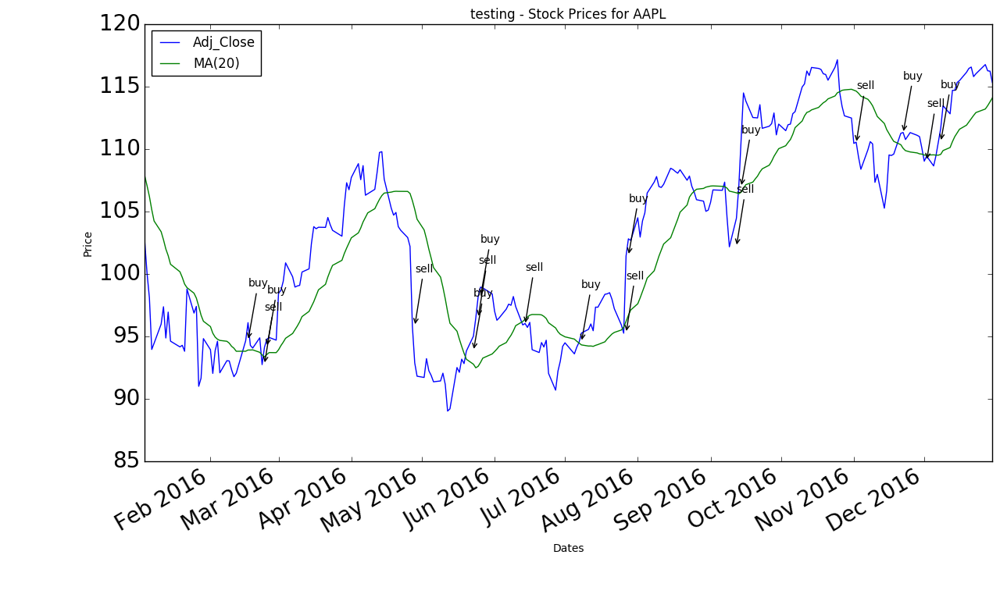

testing on stock XOM for 252 days from 2016-01-01 to 2016-12-31


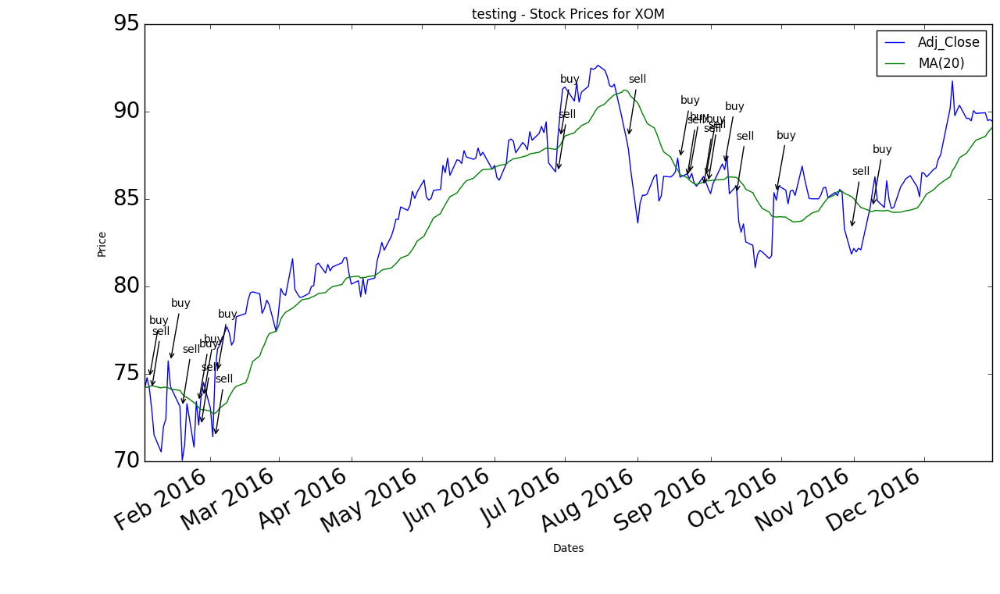

testing on stock GS for 252 days from 2016-01-01 to 2016-12-31


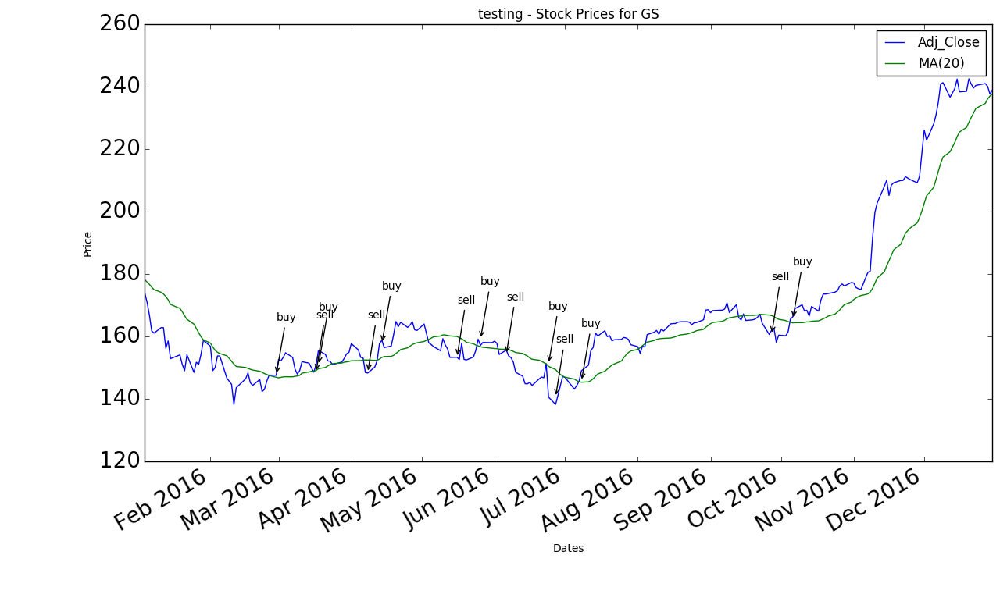

testing on stock GE for 252 days from 2016-01-01 to 2016-12-31


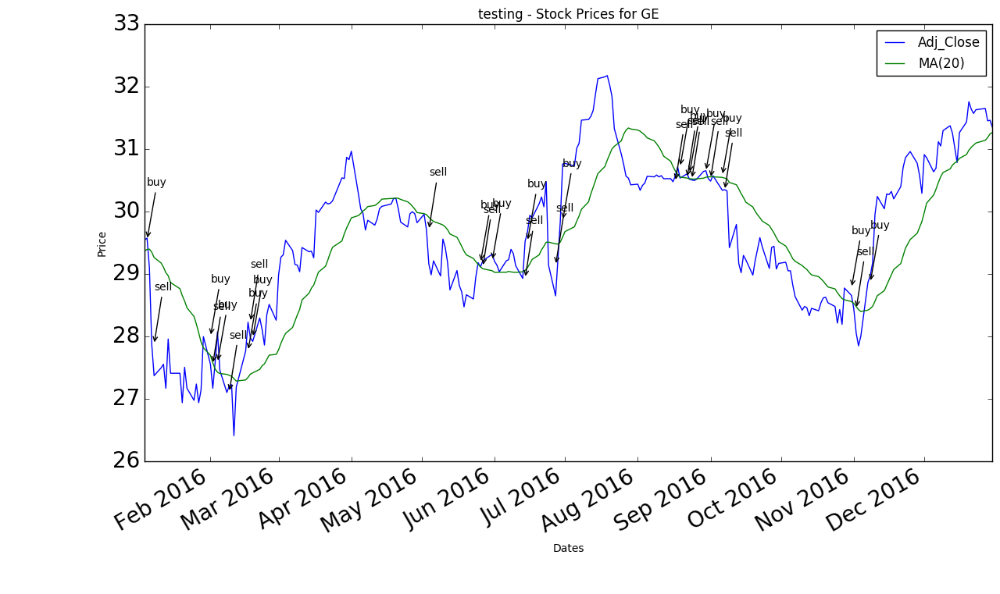

testing on stock DD for 252 days from 2016-01-01 to 2016-12-31


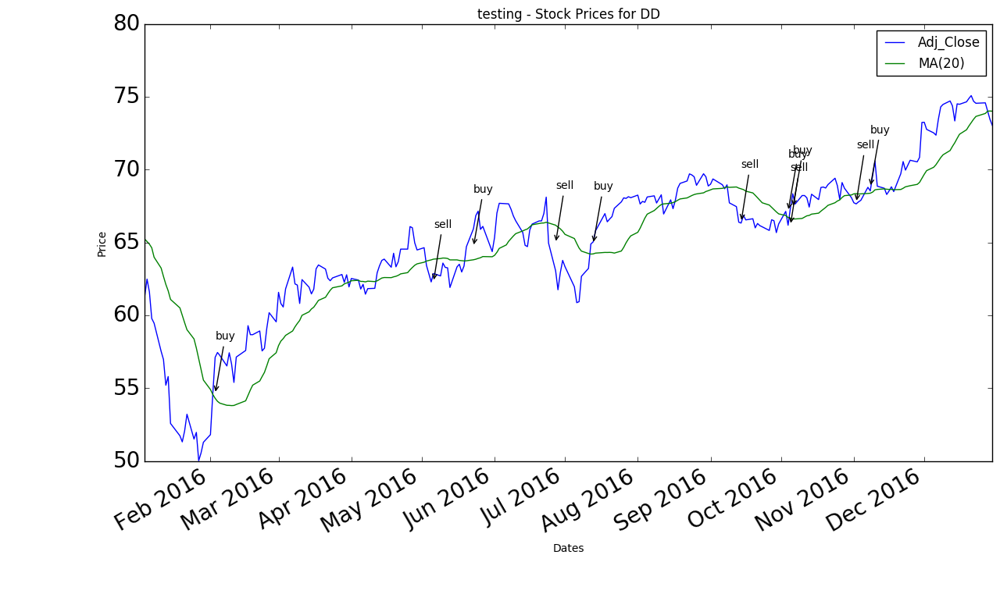

Ending testing with portfolio value 57,658.39
Net return from testing 7,658.39
Compared to buy/hold return of 9684.39957114.
Holdings after testing------
      cash      shares  initial_price   buy_price       price
AAPL   0.0   93.090242     102.612183  110.550697  116.226096
GE     0.0  329.058562      29.543124   28.860867   31.459080
XOM    0.0  115.857236      74.139424   84.536980   89.531312
DD     0.0  168.755892      61.316979   68.793914   73.446733
GS     0.0   57.752273     173.974020  165.453340  237.559060
Policies after testing------
Policy ----
If has_stock is True  and price is above MA(20) and price is below UB(20) and price is above LB(20) and price is below MA(50) and price is below UB(50) and price is above LB(50) then [None]. reward(0.000731891942793)
If has_stock is False  and price is above MA(20) and price is above UB(20) and price is above LB(20) and price is below MA(50) and price is below UB(50) and price is above LB(50) then ['buy']. reward(0.00058881716670

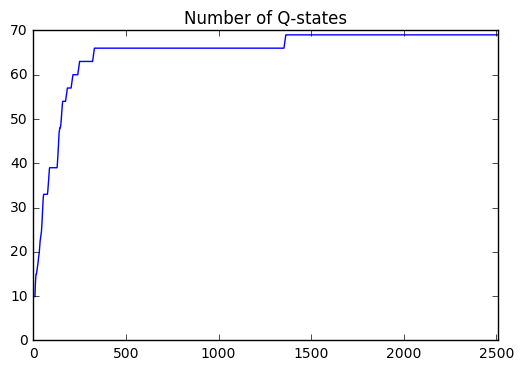

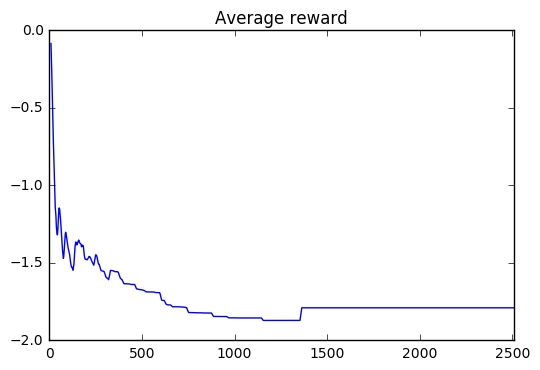

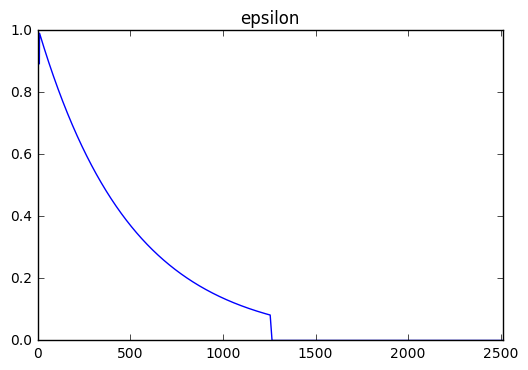

In [84]:
tr.run(stocks=['AAPL','GE','XOM','DD','GS'],initial_investment=10000.00, 
       start_train='2015-01-01',end_train='2015-12-31',
       start_test='2016-01-01',end_test='2016-12-31')

### Going back to the simple trader


Retrieving stock data for stocks ['AAPL', 'GE', 'XOM', 'DD', 'GS'] from 2014-03-07 to 2016-12-31


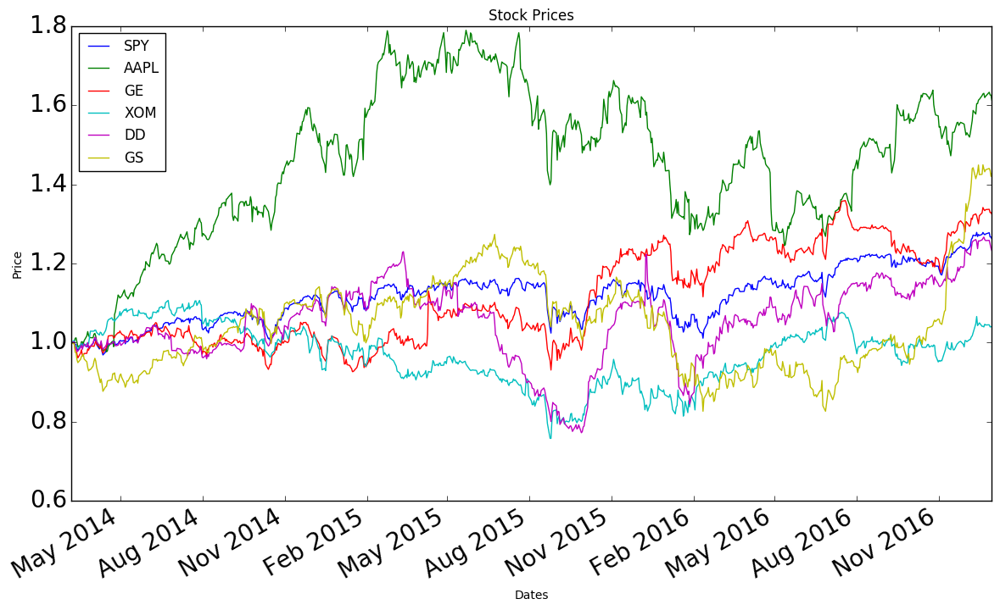

Computing averages and other data points


In [93]:
import data_utilities as du
import visuals as vs
from datetime import datetime, timedelta

stocks=['AAPL','GE','XOM','DD','GS']
initial_investment=10000.00
start_train='2015-01-01'
end_train='2015-12-31'
start_test='2016-01-01'
end_test='2016-12-31'



start_load = str((datetime.strptime(start_train, '%Y-%m-%d')-timedelta(days=300)).date())
end_load = end_test
    
#get the data
print "Retrieving stock data for stocks {} from {} to {}".format(stocks,start_load,end_load)
historydf = du.get_data(stocks,start_load,end_load)
vs.plot_data(historydf,normalize=True)
del historydf['SPY'] # get data adds this for comparison - should add logic to leave it if actually desired
stocks.remove('SPY')
    
print "Computing averages and other data points"
stockdata = du.compute_features(historydf)


Starting training with portfolio value 50,000.00
Holdings before training------
         cash  shares  initial_price  buy_price  price
AAPL  10000.0     0.0            0.0        0.0    0.0
GE    10000.0     0.0            0.0        0.0    0.0
XOM   10000.0     0.0            0.0        0.0    0.0
DD    10000.0     0.0            0.0        0.0    0.0
GS    10000.0     0.0            0.0        0.0    0.0
training on stock AAPL for 252 days from 2015-01-01 to 2015-12-31


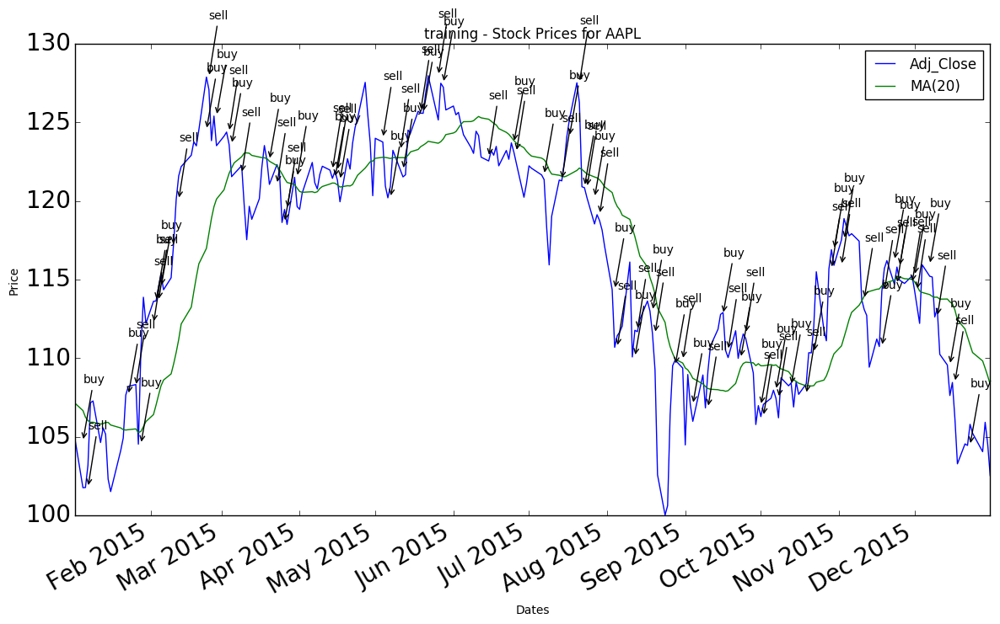

training on stock XOM for 252 days from 2015-01-01 to 2015-12-31


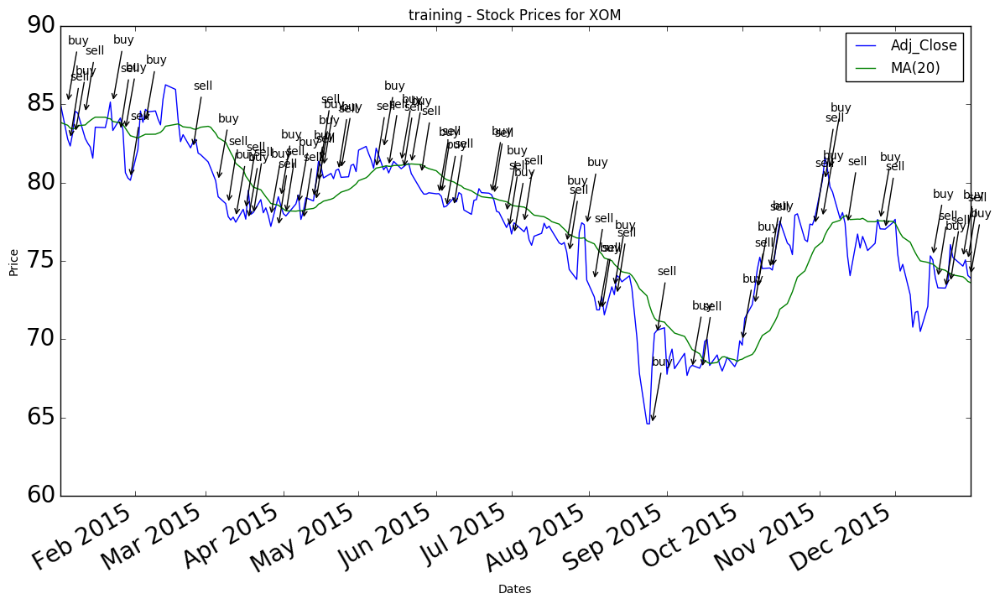

training on stock GS for 252 days from 2015-01-01 to 2015-12-31


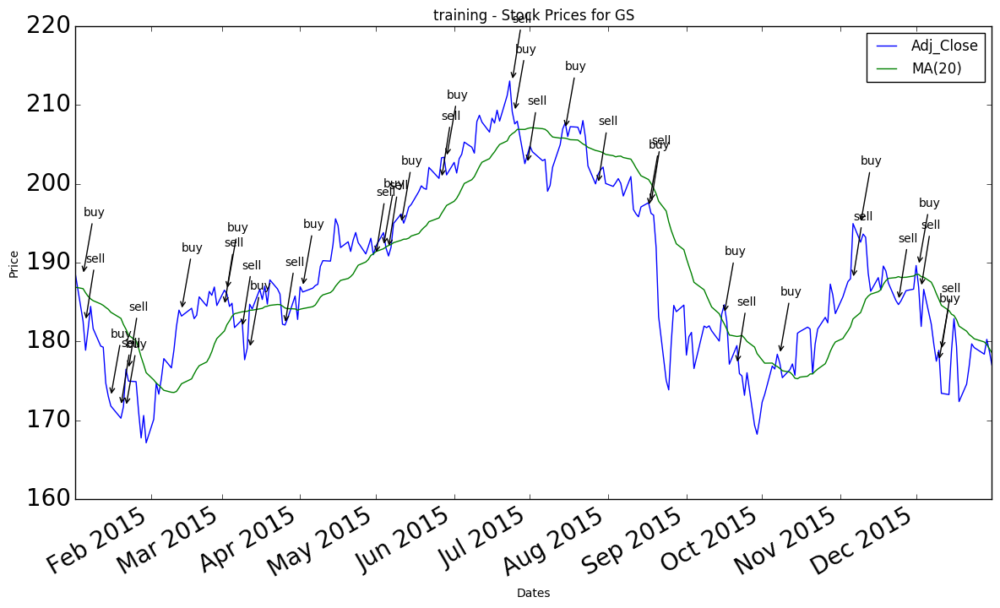

training on stock GE for 252 days from 2015-01-01 to 2015-12-31


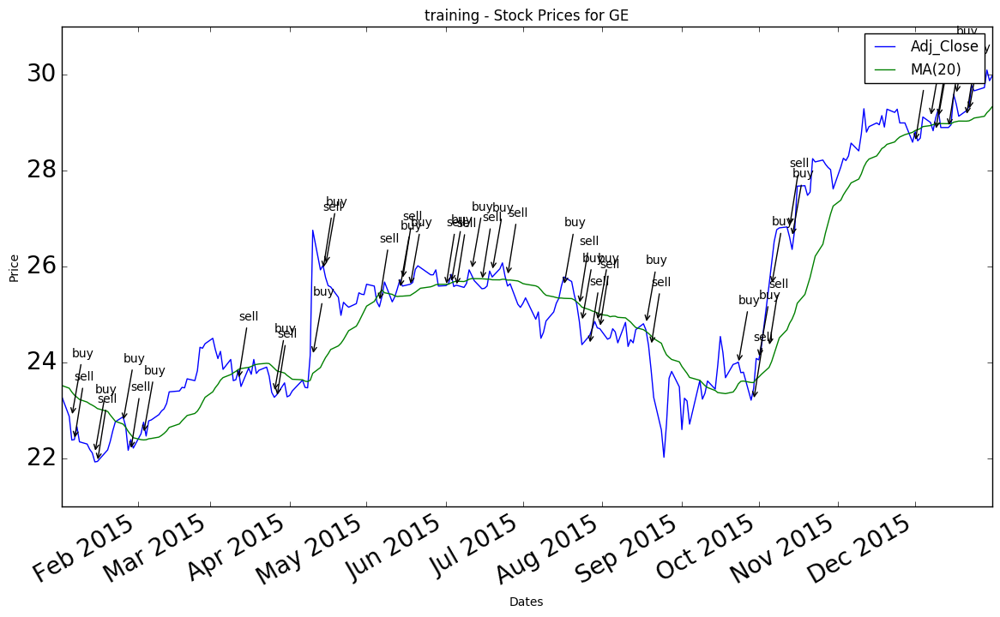

training on stock DD for 252 days from 2015-01-01 to 2015-12-31


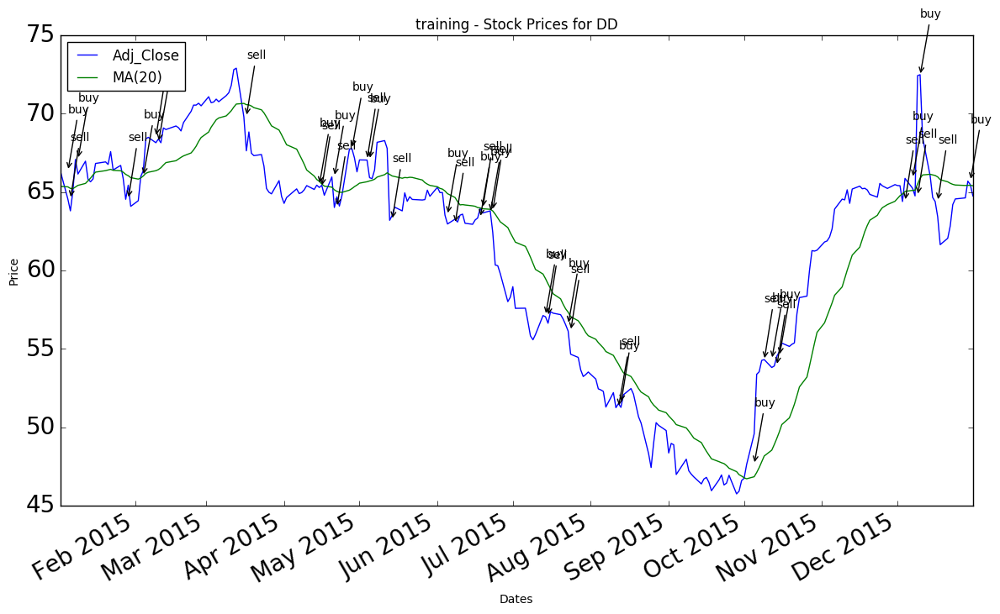

Ending training with portfolio value 50,776.37
Net return from training 776.37
Compared to buy/hold return of 858.81.
Holdings after training------
             cash      shares  initial_price   buy_price       price
AAPL     0.000000  104.199101     104.704758  104.443331  104.530989
GE       0.000000  350.864337      23.302336   29.244903   29.870205
XOM      0.000000  124.424896      85.100096   74.062174   74.062174
DD       0.000000  159.628130      66.332733   65.691903   65.458575
GS    9739.735052    0.000000     188.448888  177.480222  178.756975
Policies after training------
Policy ----
If has_stock is True  and price is below MA(20) then ['sell']. reward(0.000461726226111)
If has_stock is False  and price is above MA(20) then ['buy']. reward(0.00297544541599)
If has_stock is True  and price is above MA(20) then [None]. reward(0.00147468034031)
If has_stock is False  and price is below MA(20) then [None]. reward(0.000942352465815)
None


In [95]:
# train
features=['MA(20)']

Trader = tr.LearningTrader(learning = True, epsilon = 1, alpha = 0.25, 
                               investment=initial_investment, stocks=stocks, verbose=False, features=features)
    
tr.simulate(Trader,stocks,stockdata,start_train,end_train,mode='training')
    

Starting testing with portfolio value 50,000.00
Holdings before testing------
         cash  shares  initial_price  buy_price  price
AAPL  10000.0     0.0            0.0        0.0    0.0
GE    10000.0     0.0            0.0        0.0    0.0
XOM   10000.0     0.0            0.0        0.0    0.0
DD    10000.0     0.0            0.0        0.0    0.0
GS    10000.0     0.0            0.0        0.0    0.0
testing on stock AAPL for 252 days from 2016-01-01 to 2016-12-31


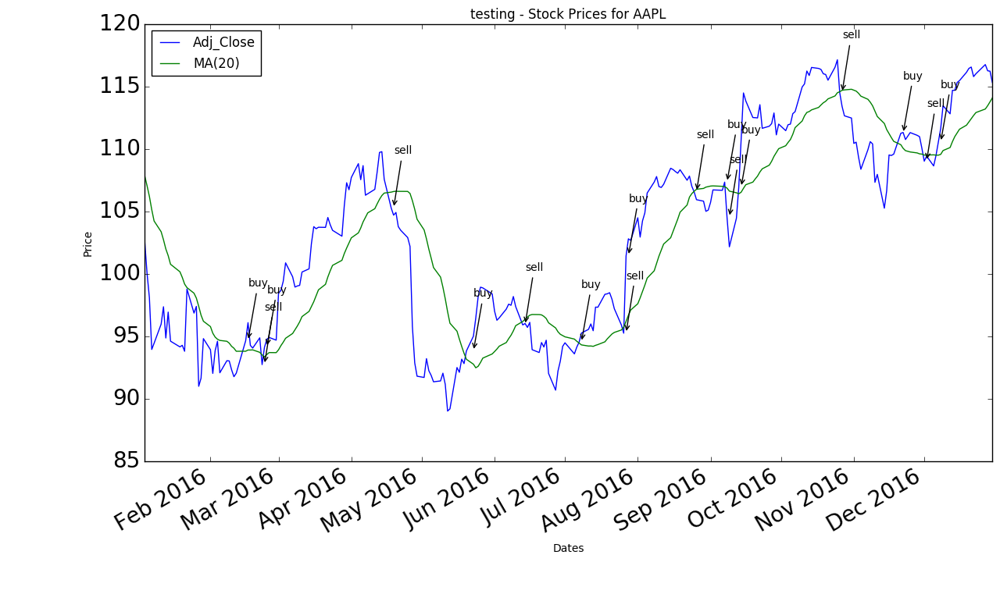

testing on stock XOM for 252 days from 2016-01-01 to 2016-12-31


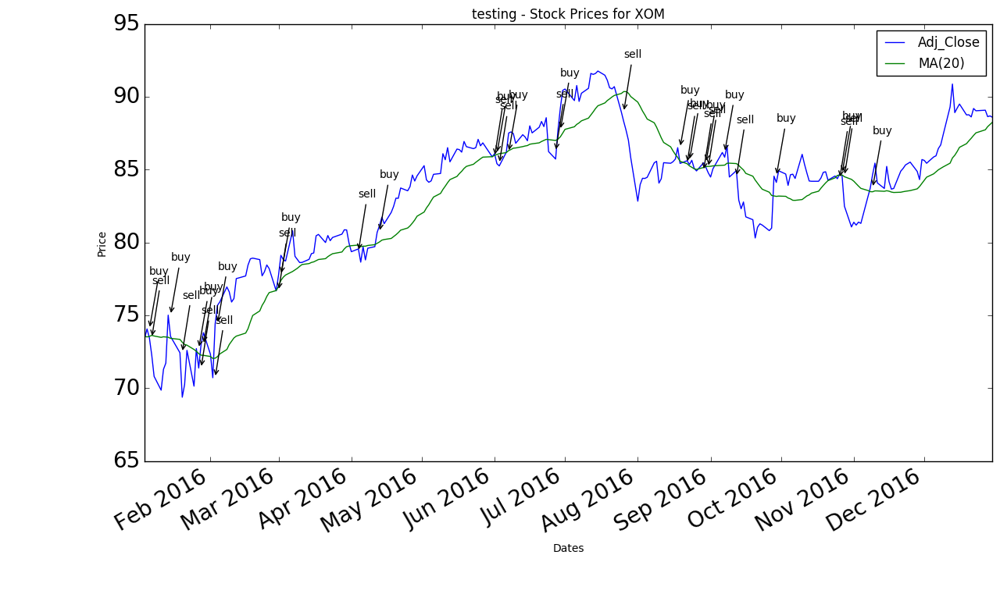

testing on stock GS for 252 days from 2016-01-01 to 2016-12-31


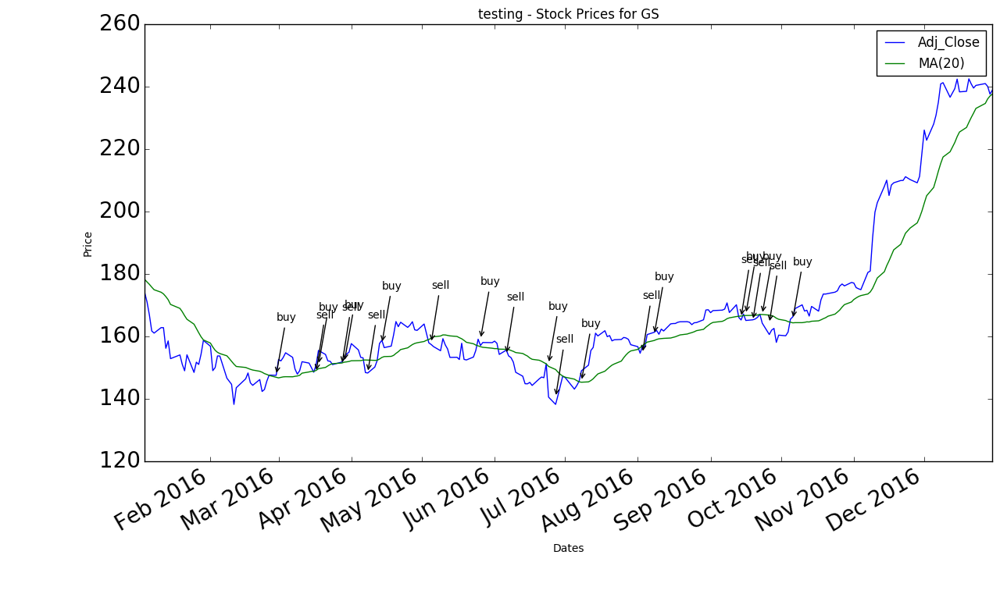

testing on stock GE for 252 days from 2016-01-01 to 2016-12-31


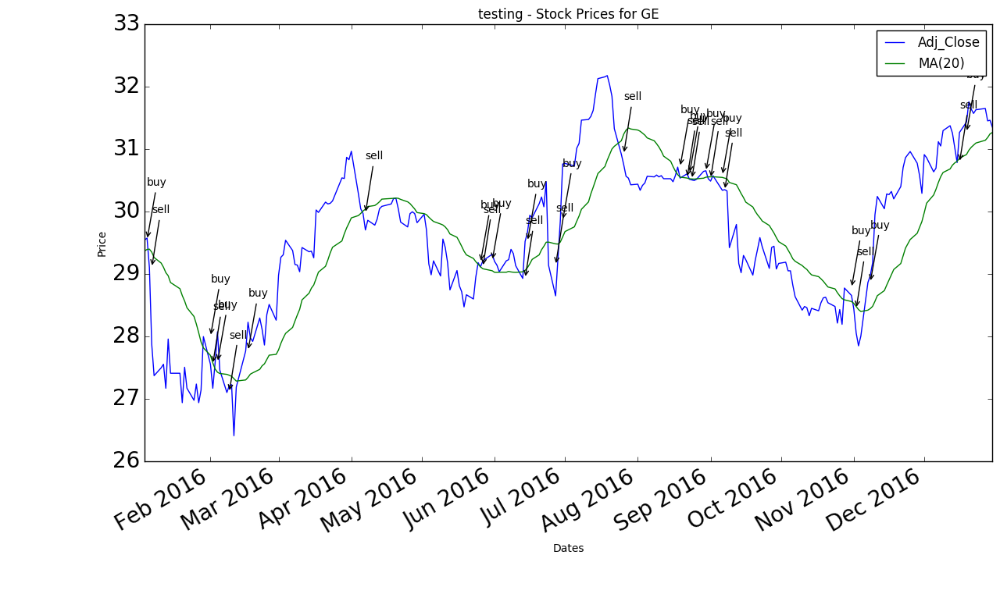

testing on stock DD for 252 days from 2016-01-01 to 2016-12-31


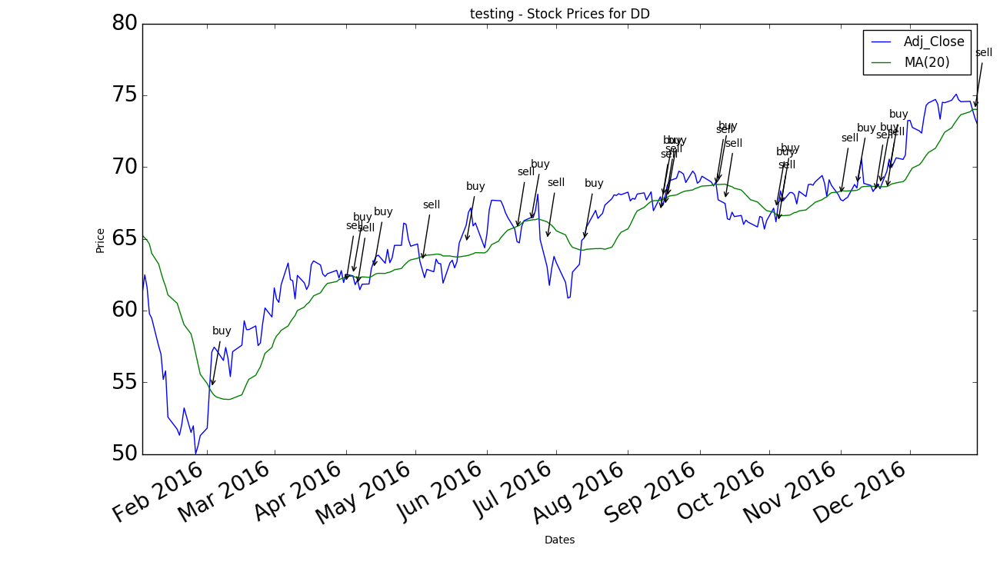

Ending testing with portfolio value 59,418.19
Net return from testing 9,418.19
Compared to buy/hold return of 9,684.40.
Holdings after testing------
             cash      shares  initial_price   buy_price       price
AAPL      0.00000  109.603469     102.612183  110.550697  116.226096
GE        0.00000  343.132781      29.543124   31.263478   31.459080
XOM       0.00000  116.777790      73.445857   83.746150   88.693761
DD    11938.54486    0.000000      61.316979   69.725142   73.446733
GS        0.00000   57.201590     173.974020  165.453340  237.559060
Policies after testing------
Policy ----
If has_stock is True  and price is below MA(20) then ['sell']. reward(0.000461726226111)
If has_stock is False  and price is above MA(20) then ['buy']. reward(0.00297544541599)
If has_stock is True  and price is above MA(20) then [None]. reward(0.00147468034031)
If has_stock is False  and price is below MA(20) then [None]. reward(0.000942352465815)
None


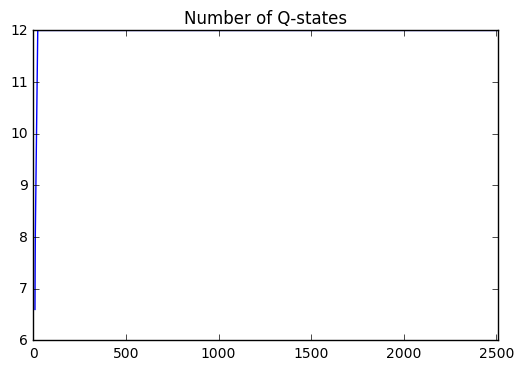

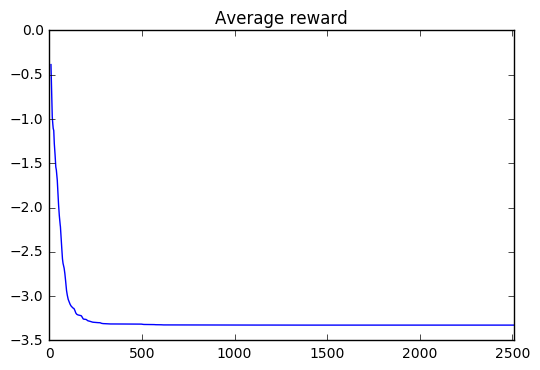

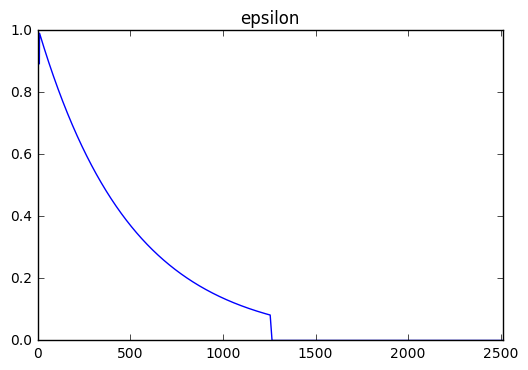

In [96]:
#test
tr.simulate(Trader,stocks,stockdata,start_test,end_test,mode='testing',verbose=False)
    
vs.plot_log(Trader.log_data)

Starting training with portfolio value 50,000.00
Holdings before training------
         cash  shares  initial_price  buy_price  price
AAPL  10000.0     0.0            0.0        0.0    0.0
GE    10000.0     0.0            0.0        0.0    0.0
XOM   10000.0     0.0            0.0        0.0    0.0
DD    10000.0     0.0            0.0        0.0    0.0
GS    10000.0     0.0            0.0        0.0    0.0
training on stock AAPL for 252 days from 2015-01-01 to 2015-12-31


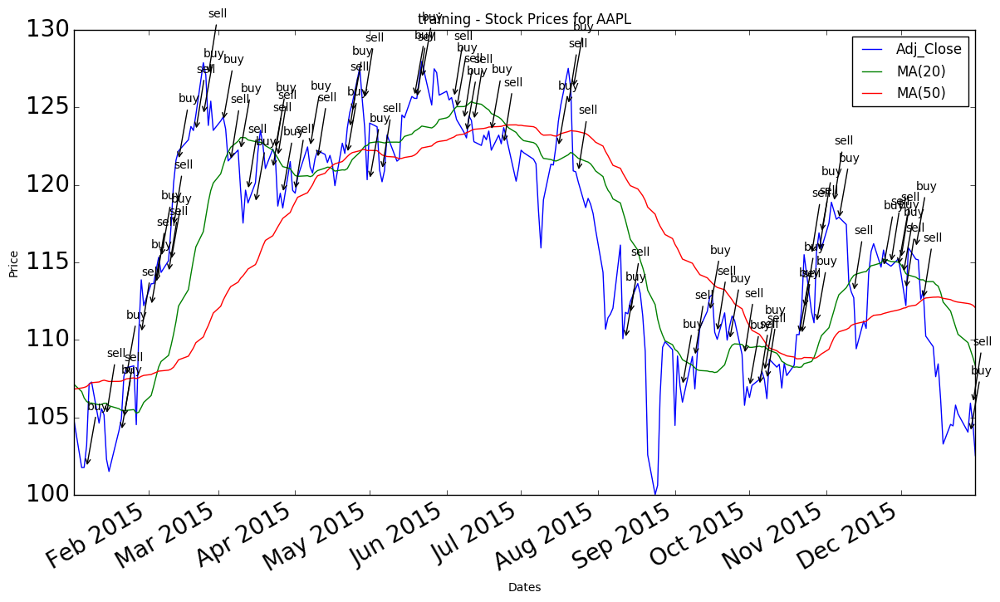

training on stock XOM for 252 days from 2015-01-01 to 2015-12-31


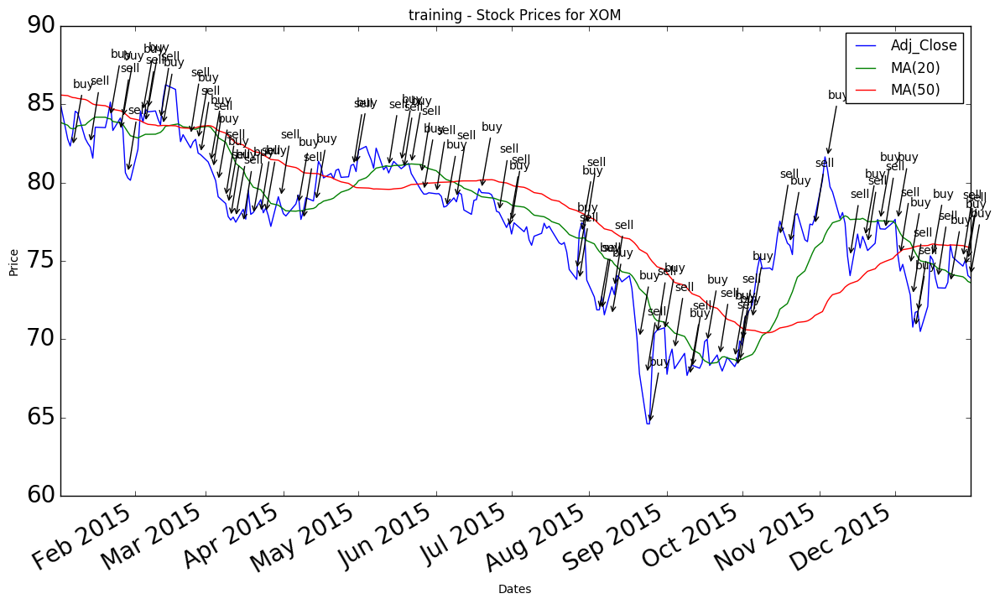

training on stock GS for 252 days from 2015-01-01 to 2015-12-31


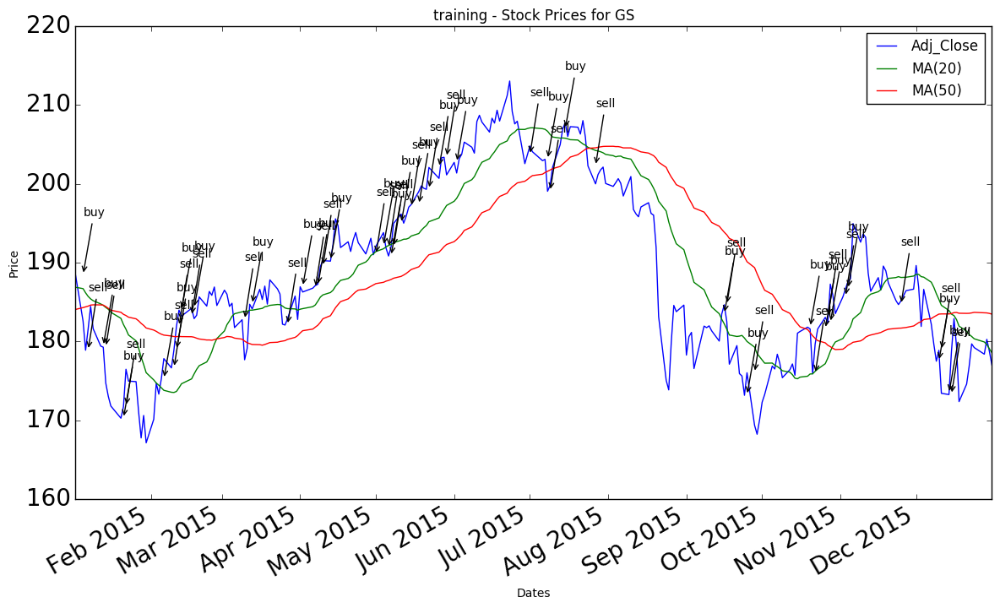

training on stock GE for 252 days from 2015-01-01 to 2015-12-31


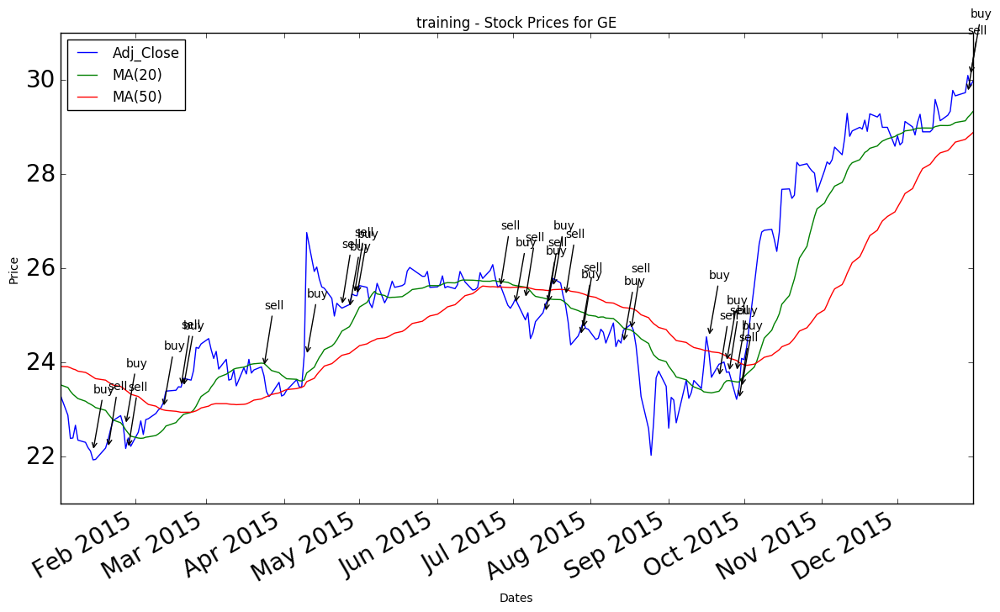

training on stock DD for 252 days from 2015-01-01 to 2015-12-31


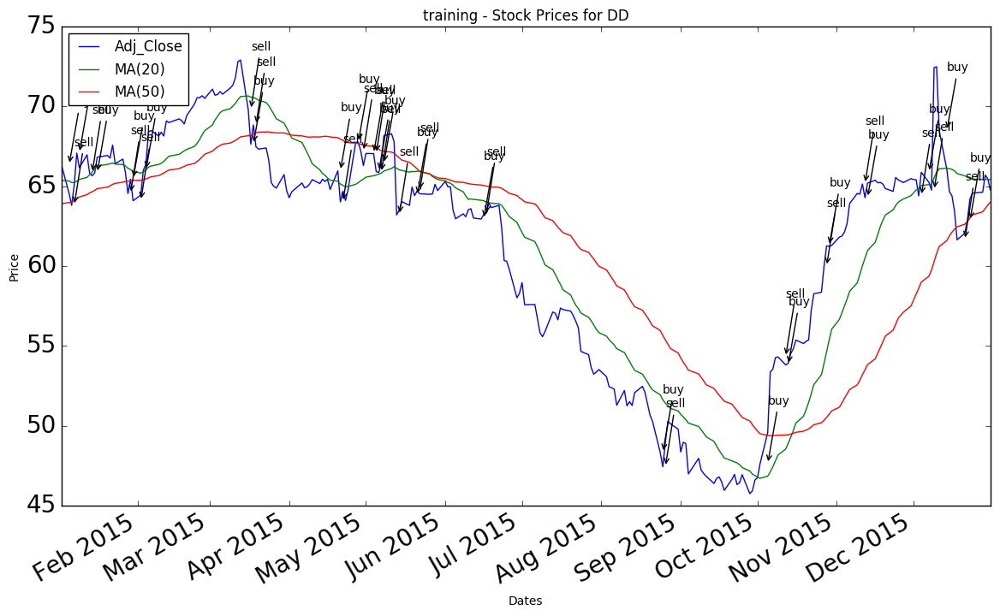

Ending training with portfolio value 54,169.02
Net return from training 4,169.02
Compared to buy/hold return of 858.81.
Holdings after training------
              cash      shares  initial_price   buy_price       price
AAPL  11273.968726    0.000000     104.704758  104.043982  104.530989
GE        0.000000  434.309201      23.302336   30.091467   29.870205
XOM       0.000000  123.448799      85.100096   74.062174   74.062174
DD        0.000000  168.520475      66.332733   62.833617   65.458575
GS     9748.152365    0.000000     188.448888  173.404385  178.756975
Policies after training------
Policy ----
If has_stock is False  and price is above MA(20) and price is below MA(50) then ['buy']. reward(0.000902971620241)
If has_stock is True  and price is below MA(20) and price is above MA(50) then [None]. reward(-0.000642828100656)
If has_stock is True  and price is below MA(20) and price is below MA(50) then ['sell']. reward(0.00190140921701)
If has_stock is False  and price is below MA(

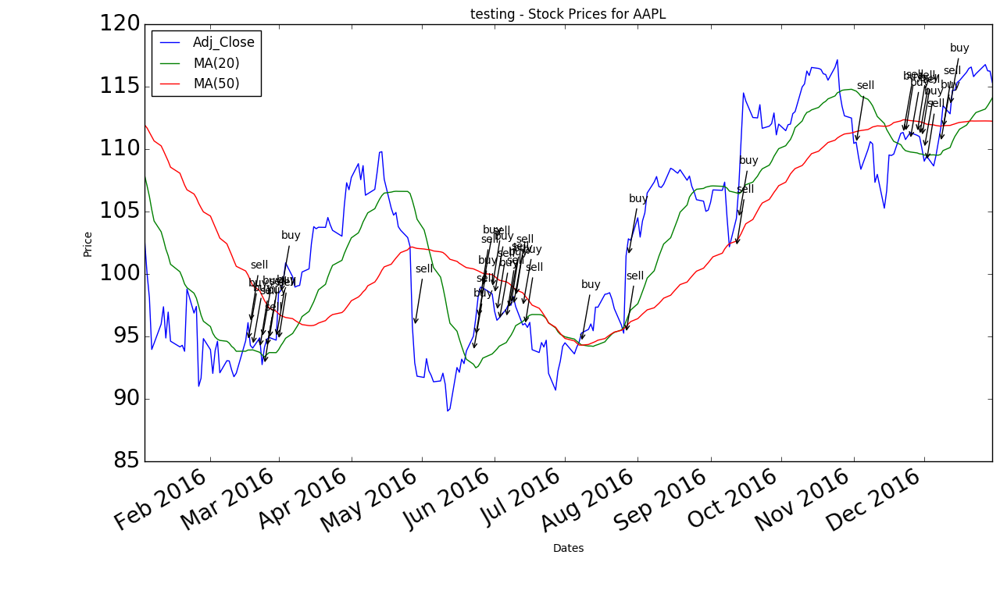

testing on stock XOM for 252 days from 2016-01-01 to 2016-12-31


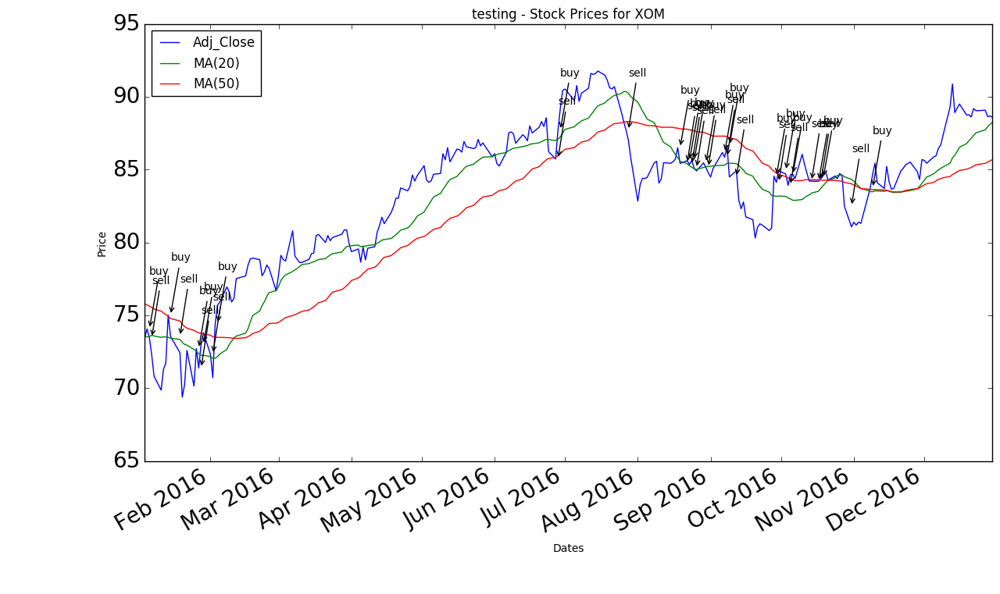

testing on stock GS for 252 days from 2016-01-01 to 2016-12-31


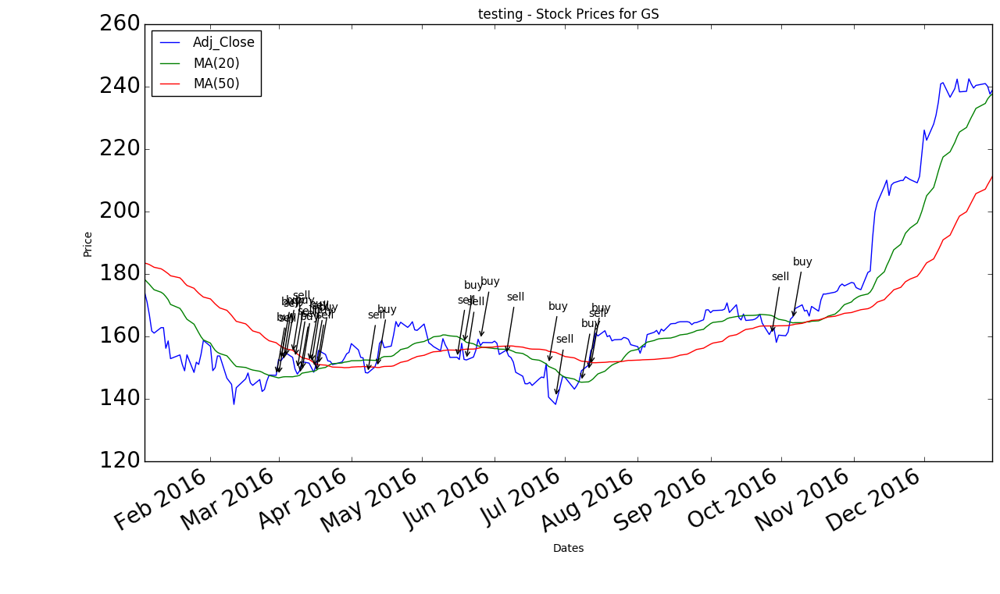

testing on stock GE for 252 days from 2016-01-01 to 2016-12-31


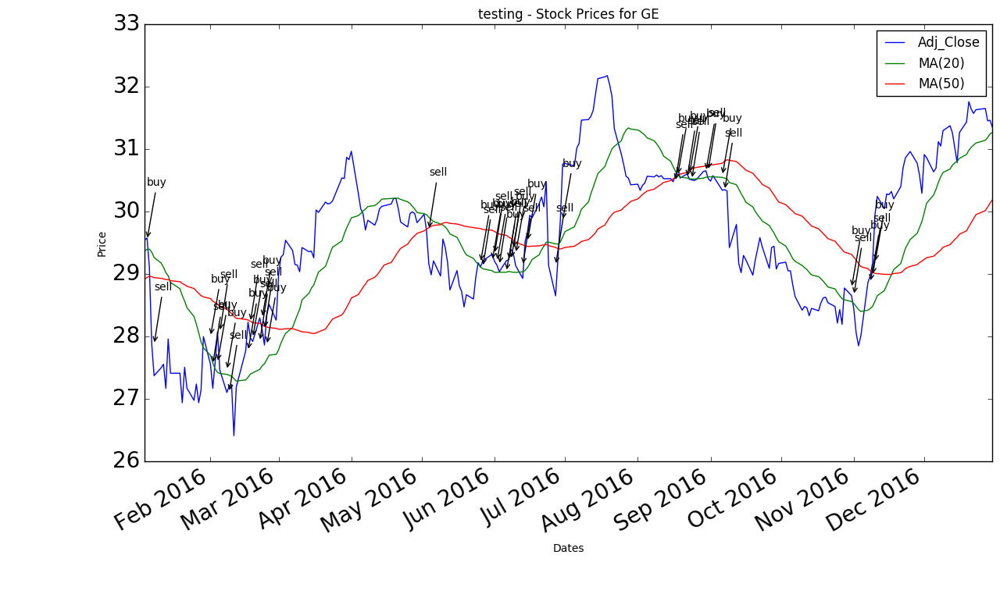

testing on stock DD for 252 days from 2016-01-01 to 2016-12-31


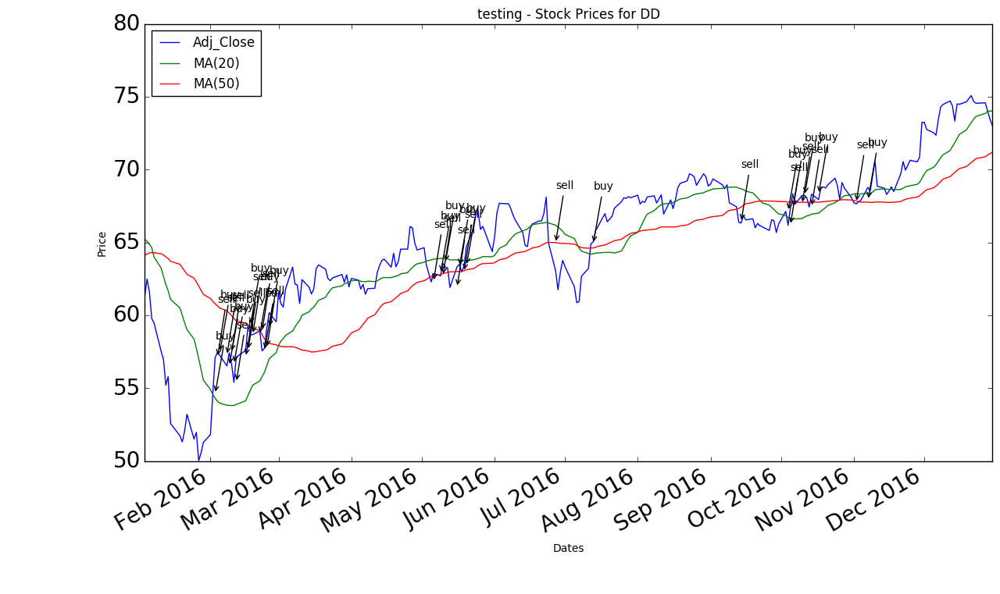

Ending testing with portfolio value 57,103.50
Net return from testing 7,103.50
Compared to buy/hold return of 9,684.40.
Holdings after testing------
      cash      shares  initial_price   buy_price       price
AAPL   0.0   93.238957     102.612183  113.458090  116.226096
GE     0.0  343.574067      29.543124   29.175963   31.459080
XOM    0.0  117.768688      73.445857   83.746150   88.693761
DD     0.0  158.562739      61.316979   67.903184   73.446733
GS     0.0   56.267766     173.974020  165.453340  237.559060
Policies after testing------
Policy ----
If has_stock is False  and price is above MA(20) and price is below MA(50) then ['buy']. reward(0.000902971620241)
If has_stock is True  and price is below MA(20) and price is above MA(50) then [None]. reward(-0.000642828100656)
If has_stock is True  and price is below MA(20) and price is below MA(50) then ['sell']. reward(0.00190140921701)
If has_stock is False  and price is below MA(20) and price is above MA(50) then ['buy']. reward

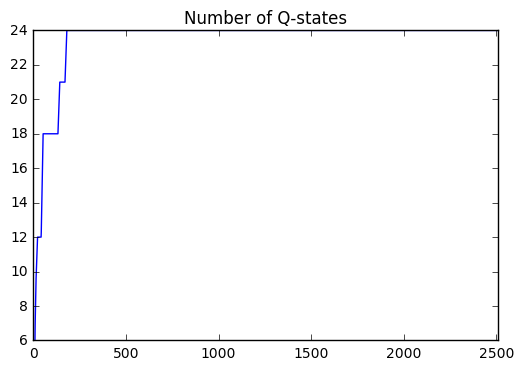

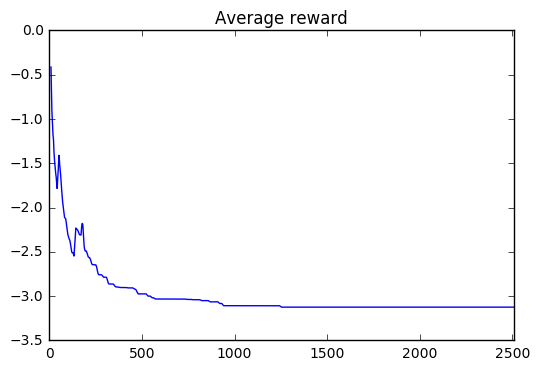

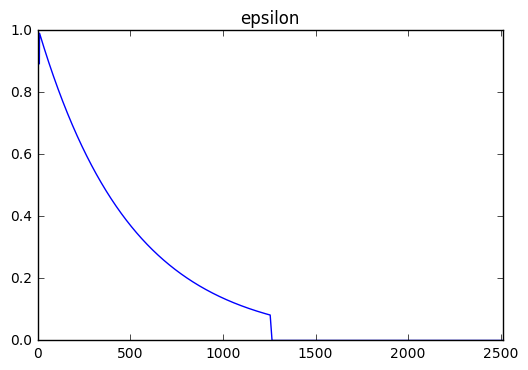

In [100]:
# train
features=['MA(20)','MA(50)']

Trader = tr.LearningTrader(learning = True, epsilon = 1, alpha = 0.25, 
                               investment=initial_investment, stocks=stocks, verbose=False, features=features)
    
tr.simulate(Trader,stocks,stockdata,start_train,end_train,mode='training')
#test
tr.simulate(Trader,stocks,stockdata,start_test,end_test,mode='testing',verbose=False)
    
vs.plot_log(Trader.log_data)
    

Starting training with portfolio value 50,000.00
Holdings before training------
         cash  shares  initial_price  buy_price  price
AAPL  10000.0     0.0            0.0        0.0    0.0
GE    10000.0     0.0            0.0        0.0    0.0
XOM   10000.0     0.0            0.0        0.0    0.0
DD    10000.0     0.0            0.0        0.0    0.0
GS    10000.0     0.0            0.0        0.0    0.0
training on stock AAPL for 252 days from 2015-01-01 to 2015-12-31


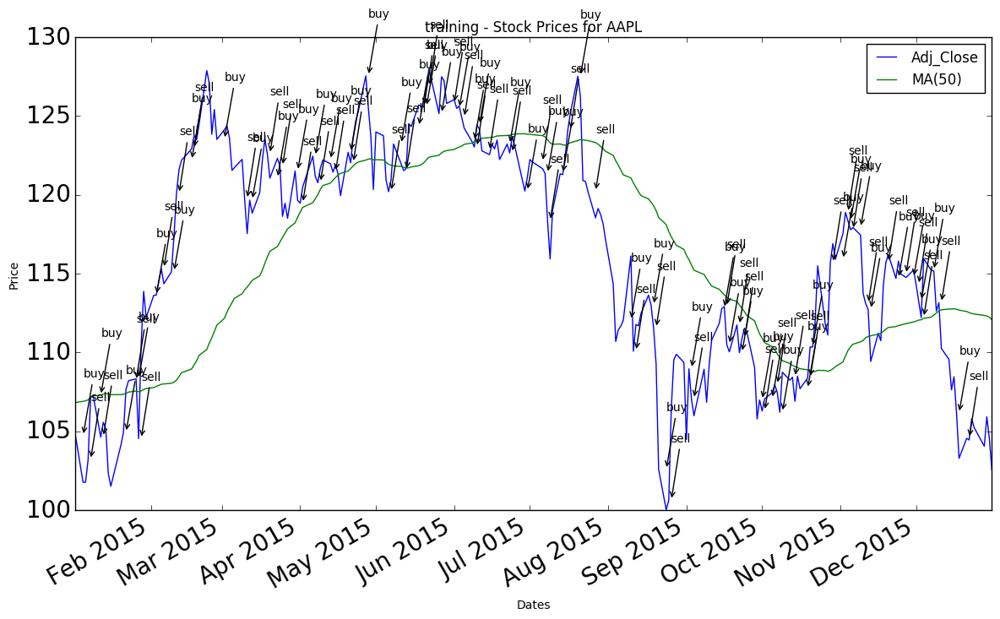

training on stock XOM for 252 days from 2015-01-01 to 2015-12-31


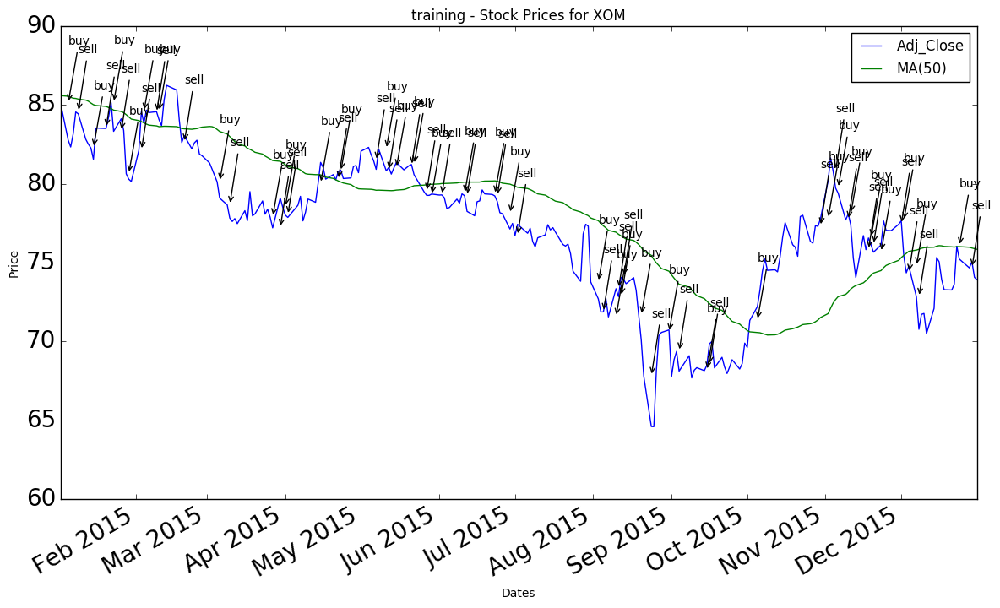

training on stock GS for 252 days from 2015-01-01 to 2015-12-31


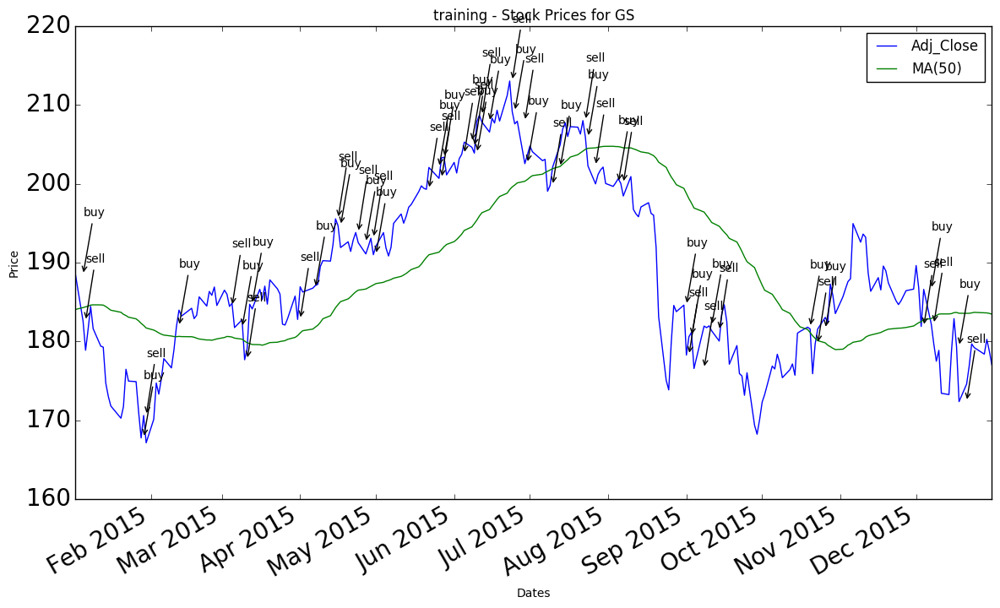

training on stock GE for 252 days from 2015-01-01 to 2015-12-31


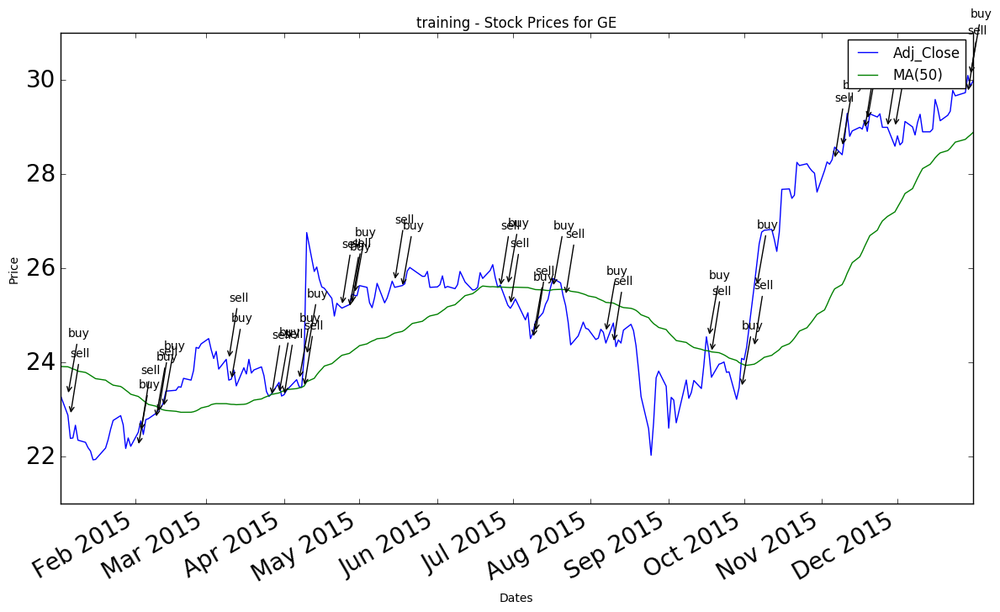

training on stock DD for 252 days from 2015-01-01 to 2015-12-31


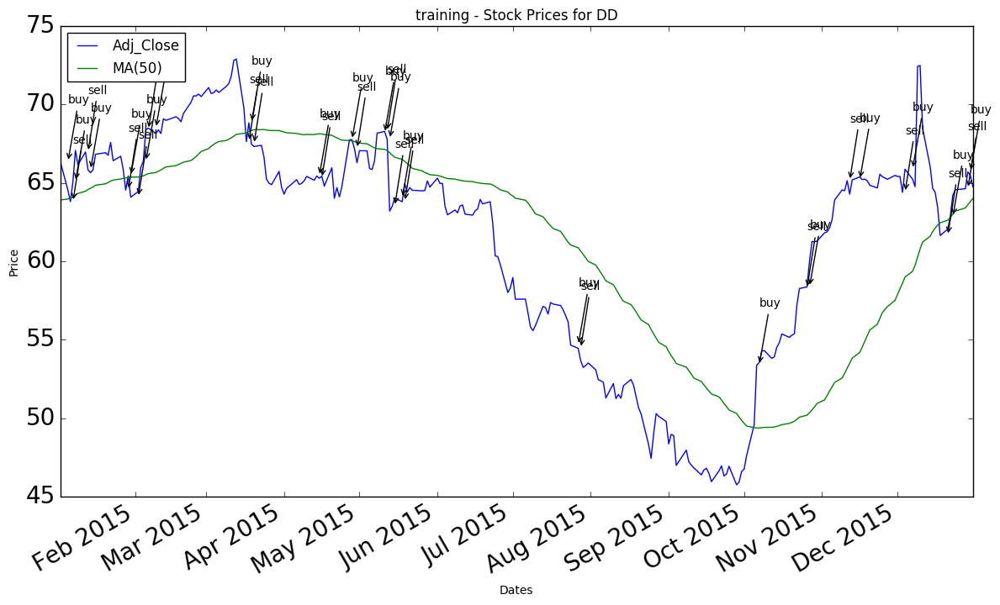

Ending training with portfolio value 48,869.72
Net return from training -1,130.28
Compared to buy/hold return of 858.81.
Holdings after training------
             cash      shares  initial_price   buy_price       price
AAPL  8566.541273    0.000000     104.704758  106.147852  104.530989
GE       0.000000  407.218132      23.302336   30.091467   29.870205
XOM   8549.702135    0.000000      85.100096   76.034386   74.062174
DD       0.000000  154.067522      66.332733   65.691903   65.458575
GS    9504.751003    0.000000     188.448888  179.346258  178.756975
Policies after training------
Policy ----
If has_stock is True  and price is below MA(50) then ['sell']. reward(0.00142056635321)
If has_stock is False  and price is above MA(50) then ['buy']. reward(0.00238788286652)
If has_stock is True  and price is above MA(50) then [None]. reward(-0.000264849836125)
If has_stock is False  and price is below MA(50) then [None]. reward(0.00125806329593)
None
Starting testing with portfolio value

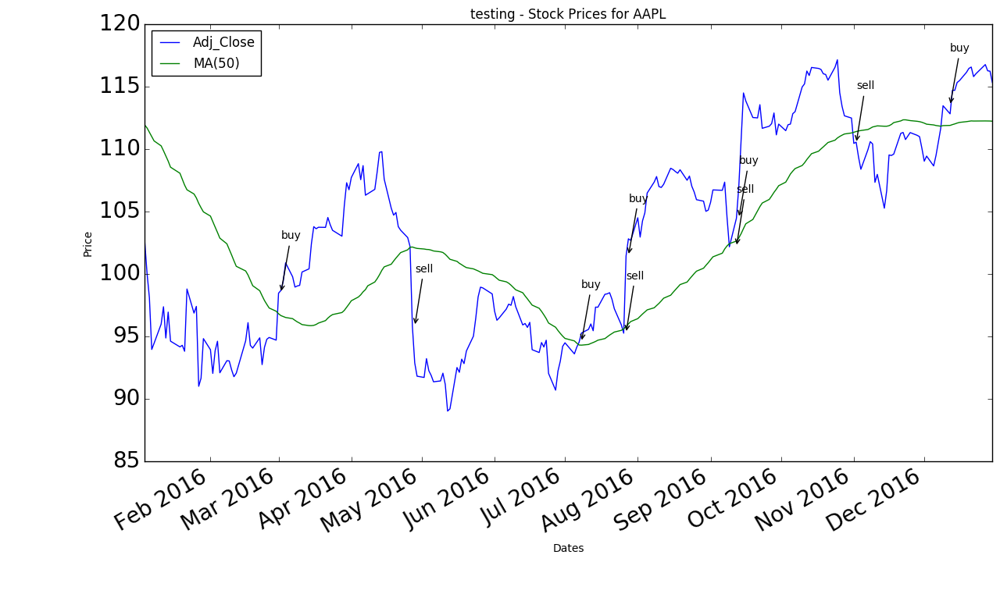

testing on stock XOM for 252 days from 2016-01-01 to 2016-12-31


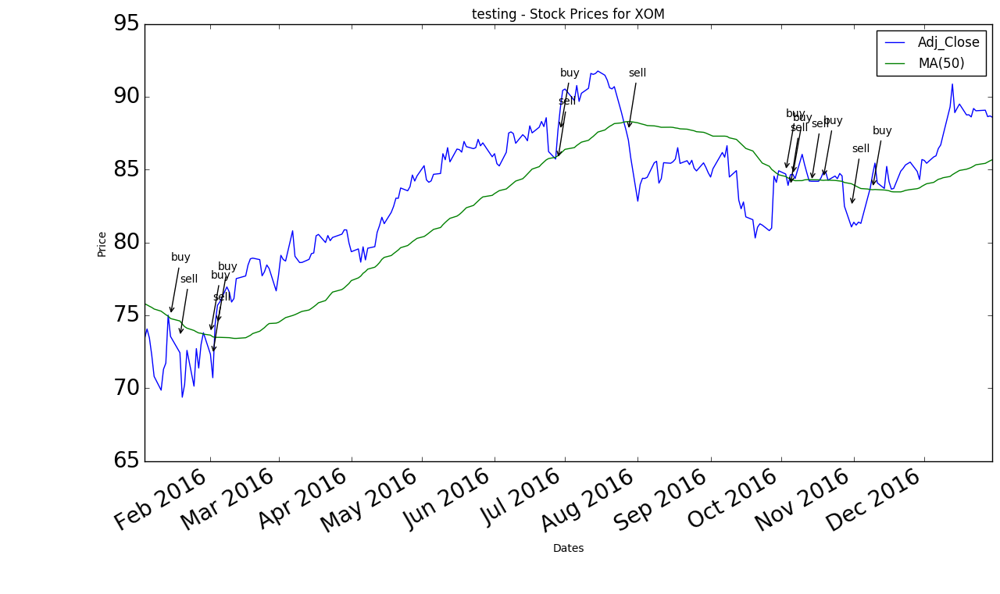

testing on stock GS for 252 days from 2016-01-01 to 2016-12-31


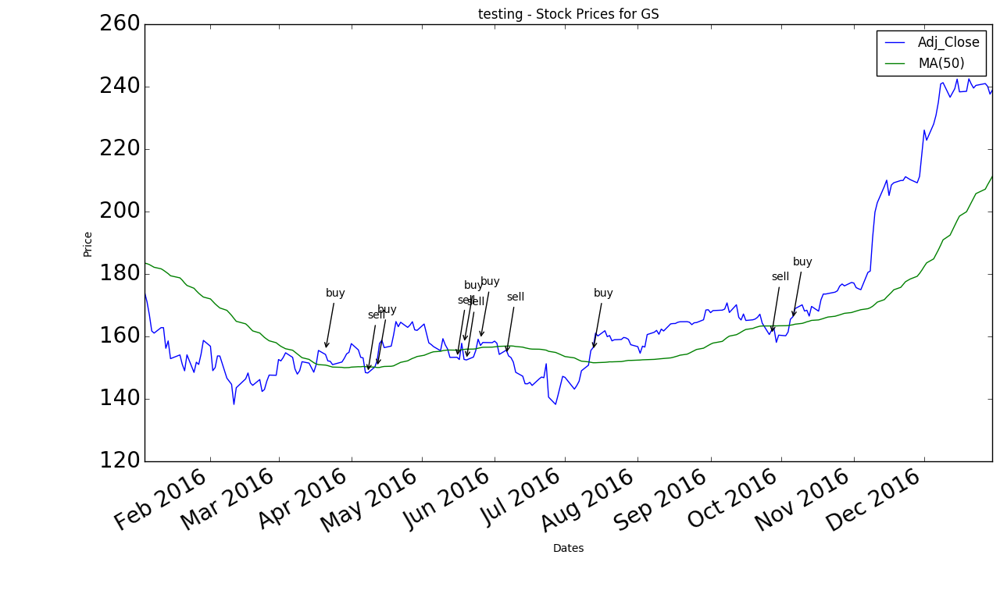

testing on stock GE for 252 days from 2016-01-01 to 2016-12-31


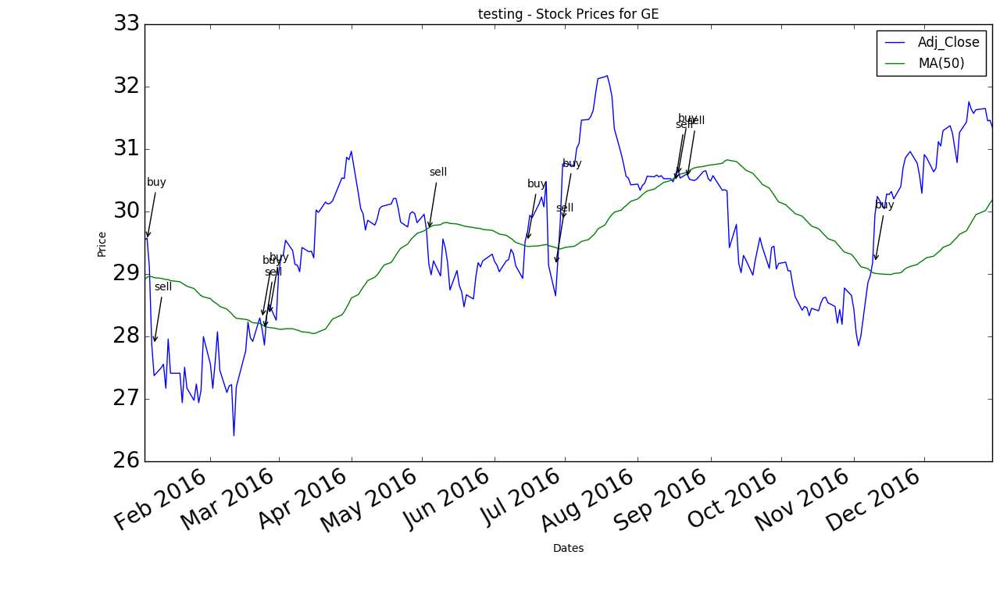

testing on stock DD for 252 days from 2016-01-01 to 2016-12-31


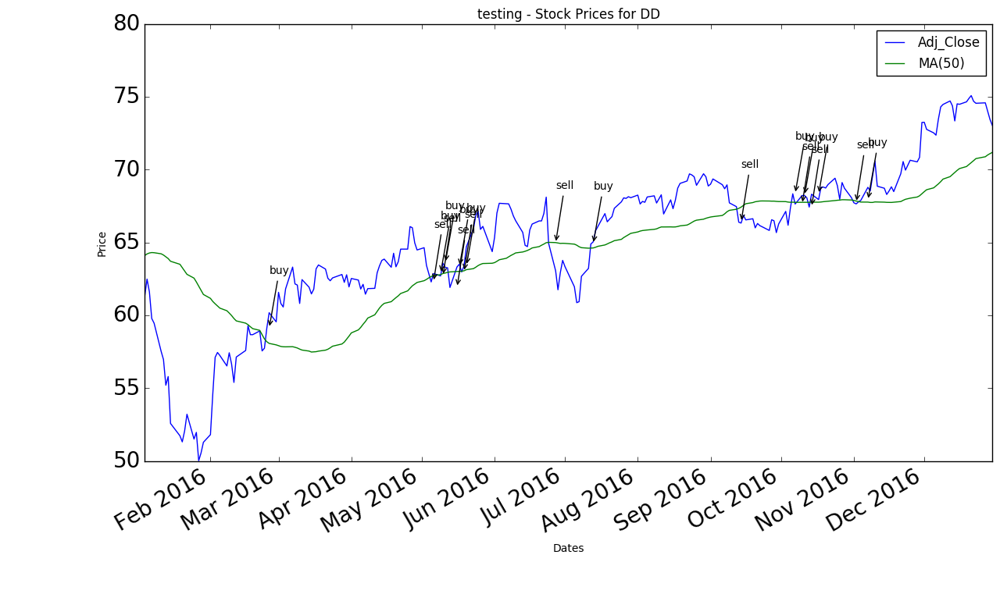

Ending testing with portfolio value 57,357.58
Net return from testing 7,357.58
Compared to buy/hold return of 9,684.40.
Holdings after testing------
      cash      shares  initial_price   buy_price       price
AAPL   0.0   92.028845     102.612183  113.458090  116.226096
GE     0.0  338.794345      29.543124   29.175963   31.459080
XOM    0.0  126.993005      73.445857   83.746150   88.693761
DD     0.0  152.396336      61.316979   67.903184   73.446733
GS     0.0   57.024833     173.974020  165.453340  237.559060
Policies after testing------
Policy ----
If has_stock is True  and price is below MA(50) then ['sell']. reward(0.00142056635321)
If has_stock is False  and price is above MA(50) then ['buy']. reward(0.00238788286652)
If has_stock is True  and price is above MA(50) then [None]. reward(-0.000264849836125)
If has_stock is False  and price is below MA(50) then [None]. reward(0.00125806329593)
None


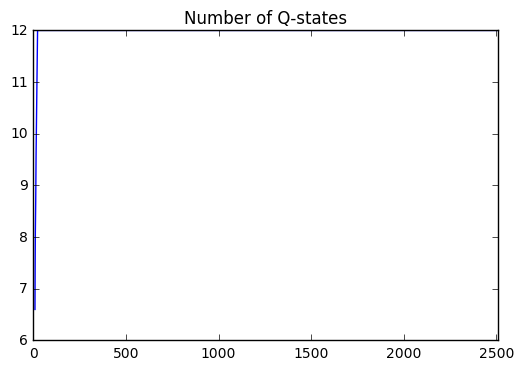

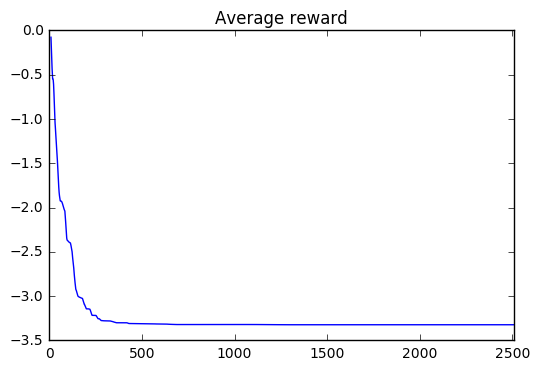

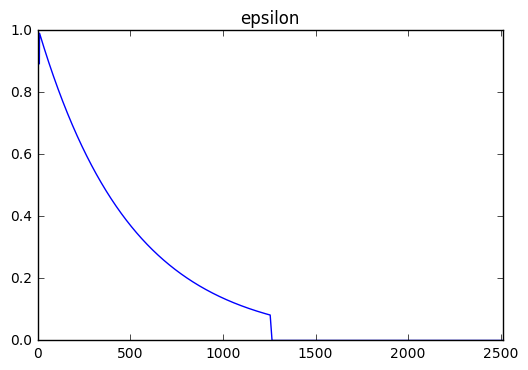

In [104]:
# train
features=['MA(50)']

Trader = tr.LearningTrader(learning = True, epsilon = 1, alpha = 0.25, 
                               investment=initial_investment, stocks=stocks, verbose=False, features=features)
    
tr.simulate(Trader,stocks,stockdata,start_train,end_train,mode='training')
#test
tr.simulate(Trader,stocks,stockdata,start_test,end_test,mode='testing',verbose=False)
    
vs.plot_log(Trader.log_data)

In [121]:
print Trader.portfolio.holdings

print sum(Trader.portfolio.holdings['price']/Trader.portfolio.holdings['initial_price']*Trader.portfolio.initial_investment)

      cash      shares  initial_price   buy_price       price
AAPL   0.0   92.028845     102.612183  113.458090  116.226096
GE     0.0  338.794345      29.543124   29.175963   31.459080
XOM    0.0  126.993005      73.445857   83.746150   88.693761
DD     0.0  152.396336      61.316979   67.903184   73.446733
GS     0.0   57.024833     173.974020  165.453340  237.559060
59684.4003328


In [129]:
print Trader.portfolio.transaction_history.loc[lambda df: df.Symbol == 'AAPL',:]


          Date Symbol Action      Shares       Price   Gain/Loss
0   2015-01-05   AAPL    buy   95.506644  104.704758    0.000000
1   2015-01-08   AAPL   sell   95.506644  103.191599 -144.516737
2   2015-01-12   AAPL    buy   91.874303  107.271380    0.000000
3   2015-01-13   AAPL   sell   91.874303  104.628140 -242.845832
4   2015-01-22   AAPL    buy   91.622704  104.915452    0.000000
5   2015-01-26   AAPL   sell   91.622704  108.200345  300.970780
6   2015-01-27   AAPL    buy   91.525496  108.315263    0.000000
7   2015-01-28   AAPL   sell   91.525496  104.522793 -347.107699
8   2015-02-03   AAPL    buy   84.203766  113.611314    0.000000
9   2015-02-06   AAPL   sell   84.203766  115.319223  143.812370
10  2015-02-10   AAPL    buy   84.358502  115.107697    0.000000
11  2015-02-12   AAPL   sell   84.358502  120.068900  418.519653
12  2015-02-17   AAPL    buy   82.898090  122.184148    0.000000
13  2015-02-18   AAPL   sell   82.898090  122.905254   59.778310
14  2015-03-02   AAPL    

In [134]:
# got  this code from stackoverflow http://stackoverflow.com/questions/39260918/download-stock-price-history-from-yahoo-finance-with-python-3-5
from pandas_datareader import data as dreader
stocks=['MMM','AXP','AAPL','BA', 'CAT', 'CVX', 'CSCO', 'KO', 'DIS', 'DD', 'XOM', 'GE',
        'GS','HD','IBM','INTC','JNJ','JPM','MCD','MRK','MSFT','NKE','PFE','PG','TRV','UTX',
       'UNH','VZ','V','WMT']
pnls = {i:dreader.DataReader(i,'yahoo','1985-01-01','2017-05-11') for i in stocks}

for df_name in pnls:
    pnls.get(df_name).to_csv("./stock_data/{}_data.csv".format(df_name), index=True, header=True)

In [137]:
print pnls.get('AAPL')

                  Open        High         Low       Close     Volume  \
Date                                                                    
1985-01-02   29.124999   29.124999   27.875000   27.875000   43825600   
1985-01-03   28.374999   29.124999   28.374999   28.374999   41652800   
1985-01-04   28.374999   28.500001   28.000000   28.374999   34316800   
1985-01-07   28.374999   28.500001   28.249999   28.249999   42728000   
1985-01-08   28.249999   28.500001   28.000000   28.000000   35280000   
1985-01-09   28.750000   29.124999   28.750000   28.750000   41680800   
1985-01-10   29.999999   30.124999   29.999999   29.999999   69266400   
1985-01-11   29.999999   30.250001   29.500001   29.750000   51262400   
1985-01-14   30.625000   30.874999   30.625000   30.625000   67608800   
1985-01-15   30.625000   31.125001   29.999999   29.999999   66242400   
1985-01-16   30.250001   30.750000   30.250001   30.250001   47471200   
1985-01-17   30.250001   30.750000   28.125000   28